# Multiple classification

## 20% test, 80% train со cross validation на train, скалирање на податоците сокористење на robust scalling, балансирање на класите (SMOTE oversampling), feature selection и трансформација на распределбата на податоците со yeo-johnson - Label (BFA, BOTNET, DDoS, DoS, Probe, U2R, Web Attack, Normal)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.metrics import specificity_score
from scipy import stats
from scipy.stats import shapiro
from sklearn.metrics import classification_report
from sklearn.feature_selection import mutual_info_classif

In [2]:
from pycaret.classification import*

In [3]:
data = pd.read_csv('InSDN.csv')

# Проверка 

In [4]:
missing_values = data.isnull().sum()
print(missing_values)
print(missing_values[missing_values > 0])

Flow ID      0
Src IP       0
Src Port     0
Dst IP       0
Dst Port     0
            ..
Idle Mean    0
Idle Std     0
Idle Max     0
Idle Min     0
Label        0
Length: 84, dtype: int64
Series([], dtype: int64)


In [5]:
data.dtypes[data.dtypes=='object']

Flow ID      object
Src IP       object
Dst IP       object
Timestamp    object
Label        object
dtype: object

# Број на примероци во класите

In [6]:
def get_percentage_cnt(df, col):   
    t1 = pd.DataFrame(df.groupby(col)[col].count().rename('%'))
    t1.reset_index(inplace=True)
    t1['%'] = round((t1['%'] * 100) / t1['%'].sum(),2)
    return t1

def myplot(x, y, df):
    ax = sns.barplot(x=x, y=y, data=df)
    for p in ax.patches:
        ax.annotate('{0:.1f}%'.format(p.get_height()), (p.get_x()+0.1, p.get_height()))

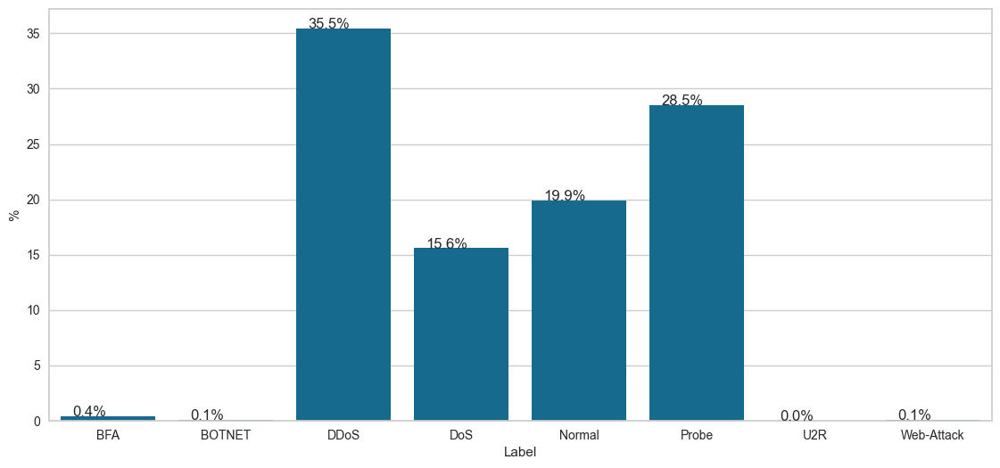

In [7]:
plt.figure(figsize=(30,6))

dual_categories = ['Label']
plt_cnt = 1
for feature in dual_categories:
    plt.subplot(1,2,plt_cnt)
    tempdf = get_percentage_cnt(data, feature)
    myplot(feature, '%', tempdf)
    plt_cnt += 1

plt.show()

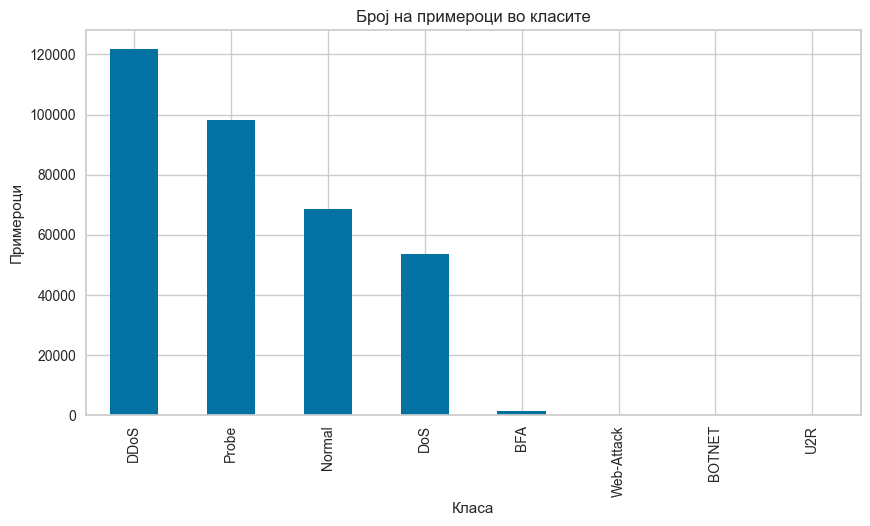

In [8]:
plt.figure(figsize=(10, 5))
data['Label'].value_counts().plot(kind='bar')
plt.title("Број на примероци во класите")
plt.xlabel("Класа")
plt.ylabel("Примероци")
plt.show()

# Карактеристики - мрежни идентификатори (се менуваат од мрежа до мрежа и за подобра генерализација се отфрлаат)

In [4]:
data.drop('Flow ID',axis=1,inplace=True)
data.drop('Src IP',axis=1,inplace=True)
data.drop('Dst IP',axis=1,inplace=True)
data.drop('Timestamp',axis=1,inplace=True)

# Матрица на корелација

In [10]:
X = data.iloc[:, :-1]

<Axes: >

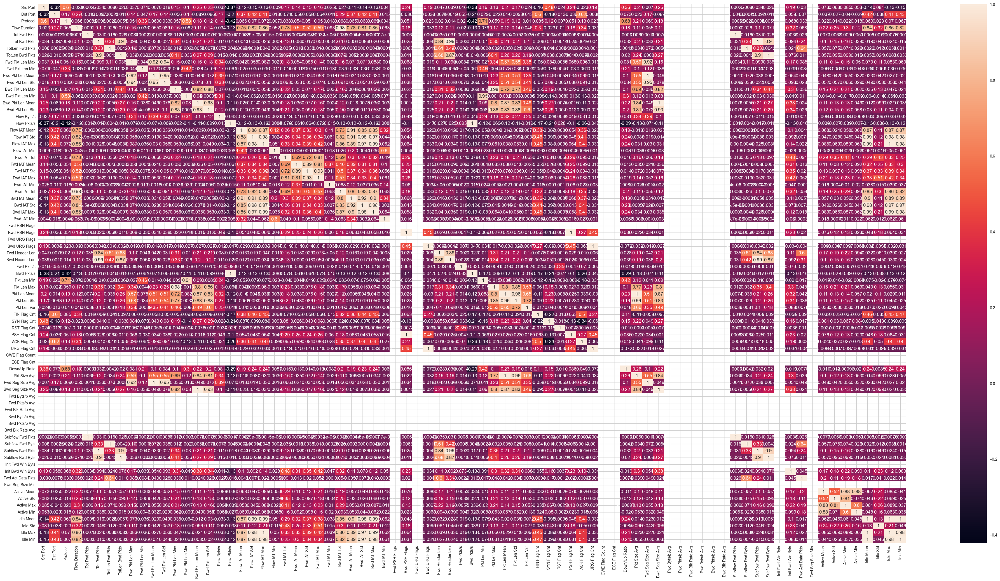

In [11]:
plt.figure(figsize=(50,25))
sns.heatmap(X.corr(),annot=True)

# Отстранување на карактеристики со константни вредности

In [12]:
unique_counts = data.nunique()

In [13]:
constant_cols = unique_counts[unique_counts < 2].index
constant_cols

Index(['Fwd PSH Flags', 'Fwd URG Flags', 'CWE Flag Count', 'ECE Flag Cnt',
       'Fwd Byts/b Avg', 'Fwd Pkts/b Avg', 'Fwd Blk Rate Avg',
       'Bwd Byts/b Avg', 'Bwd Pkts/b Avg', 'Bwd Blk Rate Avg',
       'Init Fwd Win Byts', 'Fwd Seg Size Min'],
      dtype='object')

In [5]:
data.drop("Init Fwd Win Byts", axis=1, inplace=True)
data.drop("Fwd Pkts/b Avg", axis=1, inplace=True)
data.drop("Fwd URG Flags", axis=1, inplace=True)
data.drop("Bwd Blk Rate Avg", axis=1, inplace=True)
data.drop("Bwd Byts/b Avg", axis=1, inplace=True)
data.drop("Fwd PSH Flags", axis=1, inplace=True)
data.drop("Bwd Pkts/b Avg", axis=1, inplace=True)
data.drop("Fwd Seg Size Min", axis=1, inplace=True)
data.drop("Fwd Blk Rate Avg", axis=1, inplace=True)
data.drop("CWE Flag Count", axis=1, inplace=True)
data.drop("ECE Flag Cnt", axis=1, inplace=True)
data.drop("Fwd Byts/b Avg", axis=1, inplace=True)

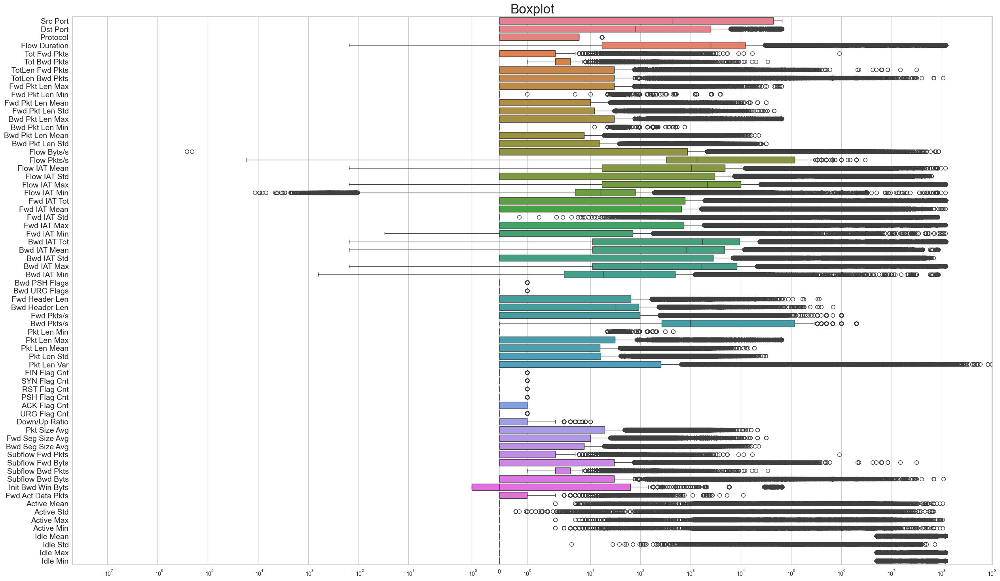

In [6]:
plt.figure(figsize=(30, 18))
sns.boxplot(data, orient="h")
plt.title('Boxplot', fontsize=24)
plt.yticks(fontsize=14)
plt.xscale('symlog')
plt.show()

In [16]:
negative_init_bwd_win_bytes = data[data['Init Bwd Win Byts'] < 0]
class_distribution = negative_init_bwd_win_bytes['Label'].value_counts()

print("Класи со негативни вредности за: 'Init Bwd Win Byts':")
print(class_distribution)

Класи со негативни вредности за: 'Init Bwd Win Byts':
DDoS      121442
Normal     34309
DoS           61
Probe         51
BFA            1
U2R            1
Name: Label, dtype: int64


In [18]:
negative_init_bwd_win_bytes = data[data['Flow Byts/s'] < 0]
class_distribution = negative_init_bwd_win_bytes['Label'].value_counts()

print("Класи со негативни вредности за: 'Flow Byts/s':")
print(class_distribution)

Класи со негативни вредности за: 'Flow Byts/s':
Normal    2
Name: Label, dtype: int64


In [20]:
negative_init_bwd_win_bytes = data[data['Flow Pkts/s'] < 0]
class_distribution = negative_init_bwd_win_bytes['Label'].value_counts()

print("Класи со негативни вредности за: 'Flow Pkts/s':")
print(class_distribution)

Класи со негативни вредности за: 'Flow Pkts/s':
Normal    8
Name: Label, dtype: int64


In [22]:
negative_init_bwd_win_bytes = data[data['Bwd IAT Mean'] < 0]
class_distribution = negative_init_bwd_win_bytes['Label'].value_counts()

print("Класи со негативни вредности за: 'Flow IAT Mean':")
print(class_distribution)

Класи со негативни вредности за: 'Flow IAT Mean':
Normal    9
Name: Label, dtype: int64


In [24]:
negative_init_bwd_win_bytes = data[data['Flow Duration'] < 0]
class_distribution = negative_init_bwd_win_bytes['Label'].value_counts()

print("Класи со негативни вредности за: 'Flow Duration':")
print(class_distribution)

Класи со негативни вредности за: 'Flow Duration':
Normal    8
Name: Label, dtype: int64


# DBSCAN за детектирање на outliers

In [6]:
from sklearn.cluster import DBSCAN

In [7]:
dbscan = DBSCAN(eps=0.3, min_samples=5)

In [9]:
X = data.iloc[:, :-1]

In [10]:
dbscan.fit(X)

DBSCAN(eps=0.3)

In [11]:
outlier_mask = dbscan.labels_ == -1

In [12]:
labels1 = dbscan.labels_
outliers = np.where(labels1 == -1)[0]
print("Број на outliers:", len(outliers))

Број на outliers: 223570


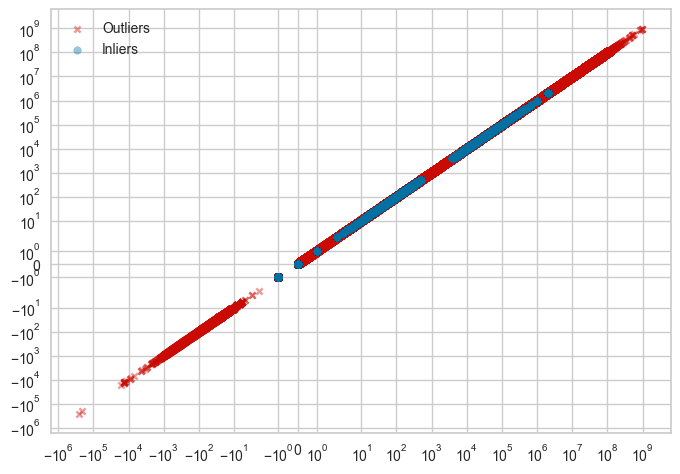

In [13]:
plt.xscale('symlog')
plt.yscale('symlog')
plt.scatter(X[outlier_mask], X[outlier_mask], c='r', marker='x', label='Outliers', alpha=0.4, s=20)
plt.scatter(X[~outlier_mask], X[~outlier_mask], c='b', marker='o', label='Inliers', alpha=0.4, s=30)
plt.legend()
plt.show()

Одредени карактеристики не може да имаат негативни вредности па се заменуваат со 0. Овие негативни вредности се застапени во нормалниот сообраќај и не се вредности како резултат на некој абнормален случај на напад и затоа се претпоставува дека се грешки при мерење односно при собирање на податоци. Вредностите помали од нула претставуваат outliers, но не може да се отстранат зошто на тој начин би се отстранила редица во податоците која можеби содржи важни информации за останататите карактеристики. Затоа тие вредности ги заменувам со 0. 

In [6]:
columns = ['Flow Duration', 'Flow Byts/s', 'Flow Pkts/s','Flow IAT Max','Flow IAT Min','Flow IAT Mean','Fwd IAT Min','Bwd IAT Tot','Bwd IAT Max','Bwd IAT Min','Bwd IAT Mean']

In [7]:
for column in columns:
    data[column] = data[column].apply(lambda x: max(0, x))

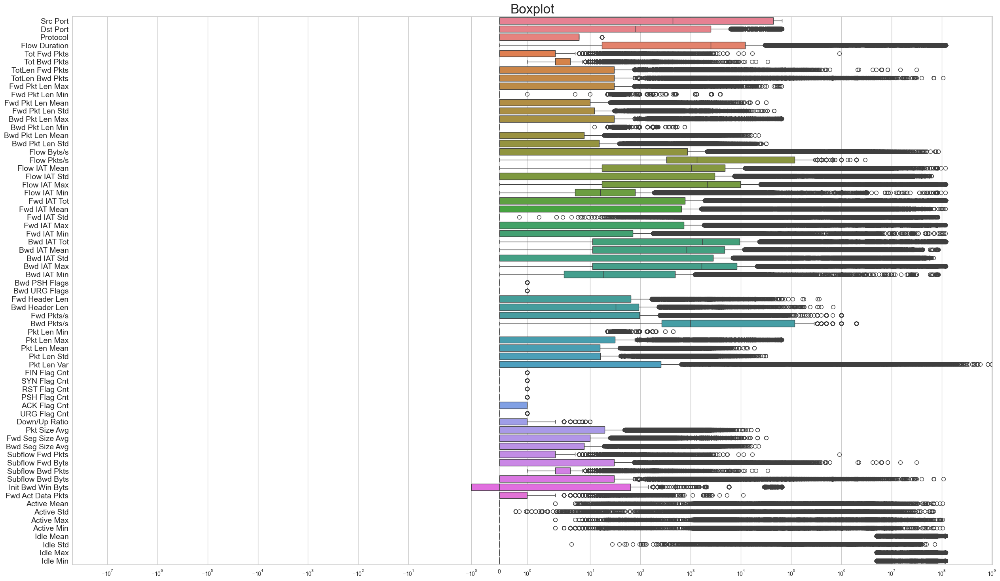

In [8]:
plt.figure(figsize=(30, 18))
sns.boxplot(data, orient="h")
plt.title('Boxplot', fontsize=24)
plt.yticks(fontsize=14)
plt.xscale('symlog')
plt.show()

In [9]:
X = data.iloc[:, :-1]

<Axes: >

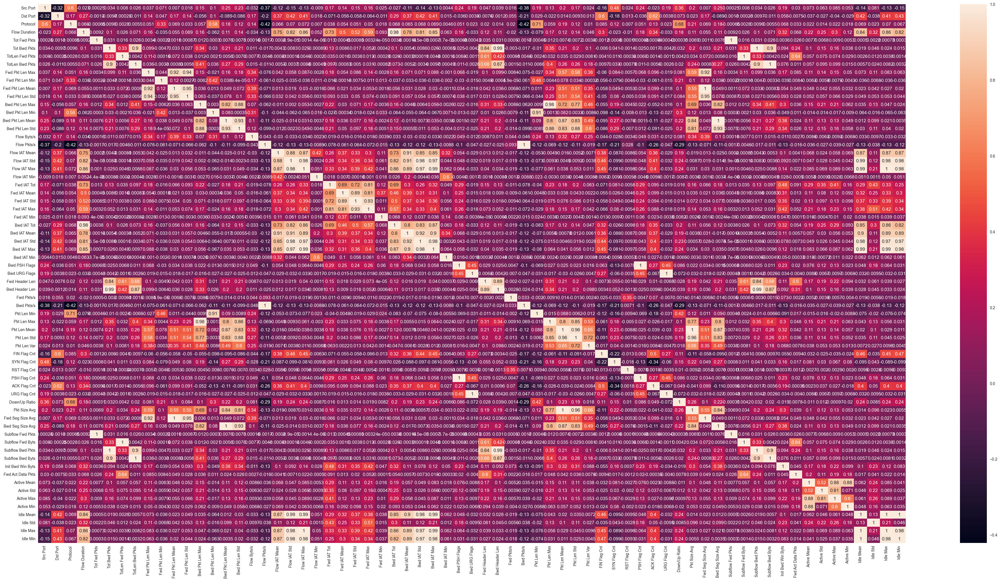

In [10]:
plt.figure(figsize=(50,25))
sns.heatmap(X.corr(),annot=True)

# Распределба на податоците

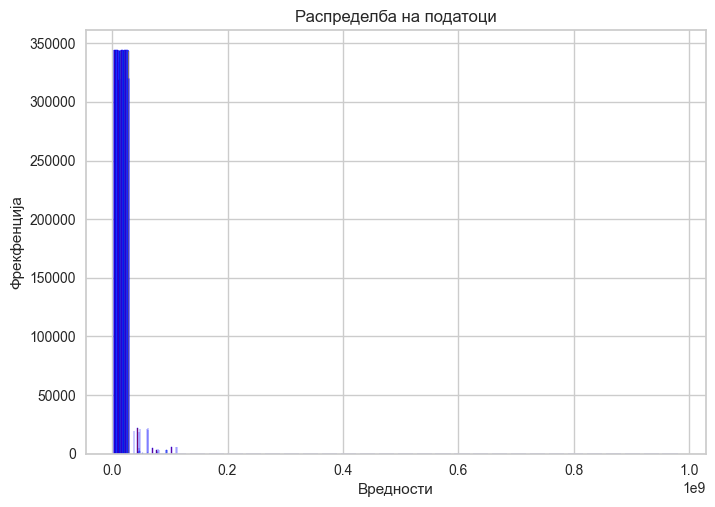

In [11]:
plt.hist(X, bins=30, edgecolor='blue')
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

## Shapiro-Wilk тест 

In [12]:
shapiro(X)

ShapiroResult(statistic=0.09100228548049927, pvalue=0.0)

pvalue = 0.0 < 0.5 не може да се претпостави дека е нормална дистрибуцијата на податоците

In [8]:
exp1 = setup(data,target='Label',train_size=0.8,session_id=89,normalize=True,normalize_method='robust',transformation=True,transformation_method='yeo-johnson',fix_imbalance=True,fix_imbalance_method='smote',fold_strategy='stratifiedkfold',fold=5)

,Description,Value
0,Session id,89
1,Target,Label
2,Target type,Multiclass
3,Target mapping,"BFA: 0, BOTNET: 1, DDoS: 2, DoS: 3, Normal: 4, Probe: 5, U2R: 6, Web-Attack: 7"
4,Original data shape,"(343889, 68)"
5,Transformed data shape,"(849202, 68)"
6,Transformed train set shape,"(780424, 68)"
7,Transformed test set shape,"(68778, 68)"
8,Numeric features,67
9,Preprocess,True


# Скалирање

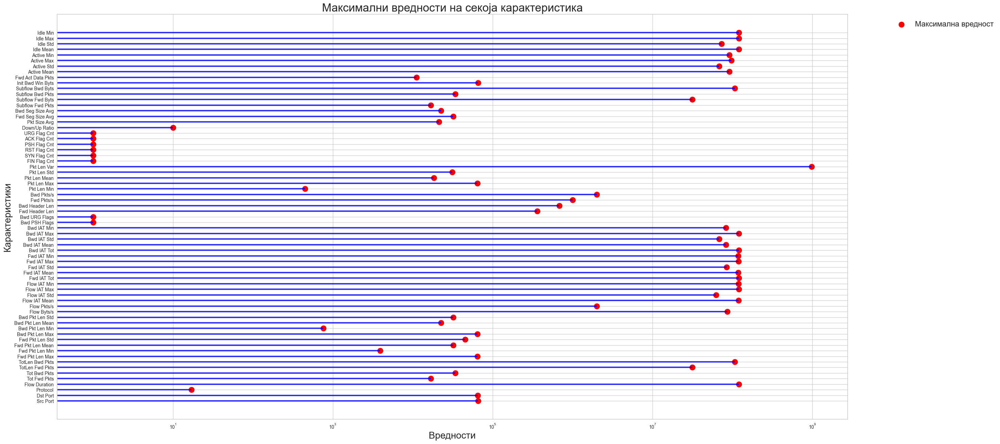

In [14]:
fig, ax = plt.subplots(figsize=(30, 15.5))

ax.scatter(get_config('X_train').max(), get_config('X_train').columns, color='red', marker='o', s=150, label='Максимална вредност')

for feature in get_config('X_train').columns:
    max_value = get_config('X_train')[feature].max()
    ax.hlines(y=feature, xmin=0, xmax=max_value, color='blue', linestyle='-', linewidth=3, alpha=0.8)
ax.set_xscale('log')
ax.set_xlabel('Вредности', fontsize=20)
ax.set_ylabel('Карактеристики', fontsize=20)
ax.set_title('Максимални вредности на секоја карактеристика', fontsize=24)
ax.legend(fontsize=16, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

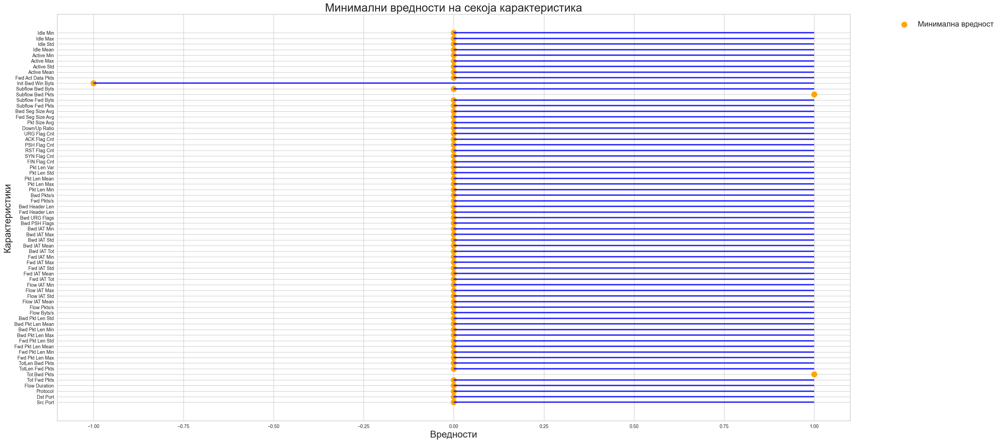

In [15]:
fig, ax = plt.subplots(figsize=(30, 15.5))
ax.scatter(get_config('X_train').min(), get_config('X_train').columns, color='orange', marker='o', s=150, label='Минимална вредност')



for feature in get_config('X_train').columns:
    min_value = get_config('X_train')[feature].min()
    ax.hlines(y=feature, xmin=1, xmax=min_value, color='blue', linestyle='-', linewidth=3, alpha=0.8)

ax.set_xlabel('Вредности', fontsize=20)
ax.set_ylabel('Карактеристики', fontsize=20)
ax.set_title('Минимални вредности на секоја карактеристика', fontsize=24)
ax.legend(fontsize=16, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

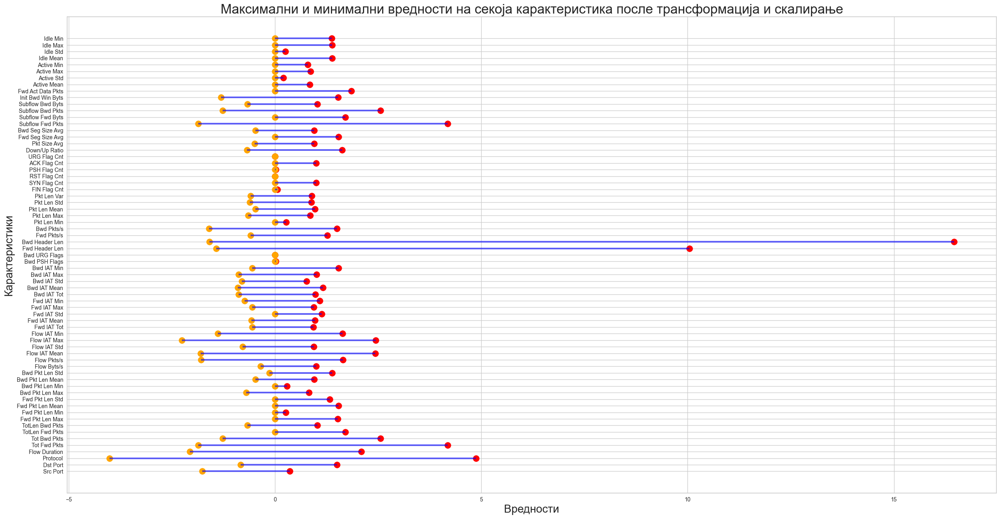

In [16]:
fig, ax = plt.subplots(figsize=(30, 15.5))
ax.scatter(get_config('X_train_transformed').max(), get_config('X_train_transformed').columns, color='red', marker='o', s=130, label='Максимална вредност')
ax.scatter(get_config('X_train_transformed').min(), get_config('X_train_transformed').columns, color='orange', marker='o', s=130, label='Минимална вредност')
for feature in get_config('X_train_transformed').columns:
    max_value = get_config('X_train_transformed')[feature].max()
    min_value = get_config('X_train_transformed')[feature].min()
    ax.hlines(y=feature, xmin=0, xmax=max_value, color='blue', linestyle='-', linewidth=3, alpha=0.6)
    ax.hlines(y=feature, xmin=0, xmax=min_value, color='blue', linestyle='-', linewidth=3, alpha=0.6)

ax.set_xlabel('Вредности', fontsize=20)
ax.set_ylabel('Карактеристики', fontsize=20)
ax.set_title('Mаксимални и минимални вредности на секоја карактеристика после трансформација и скалирање',fontsize=24)
plt.show()

# Трансформација на податоците со yeo-johnson

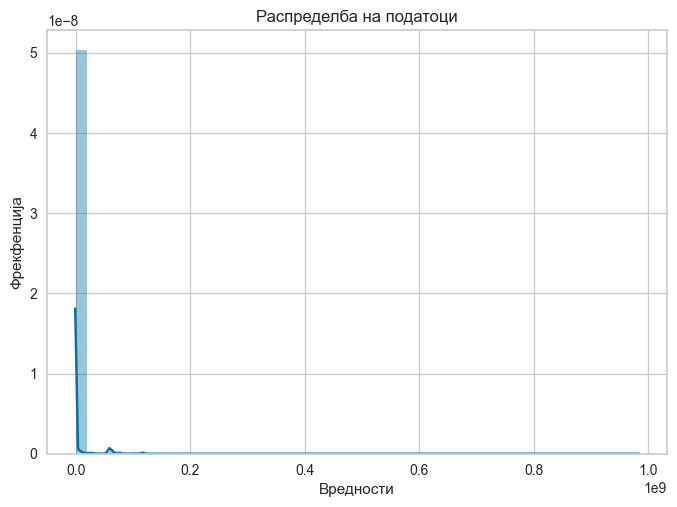

In [17]:
sns.distplot(get_config('X_train'))
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

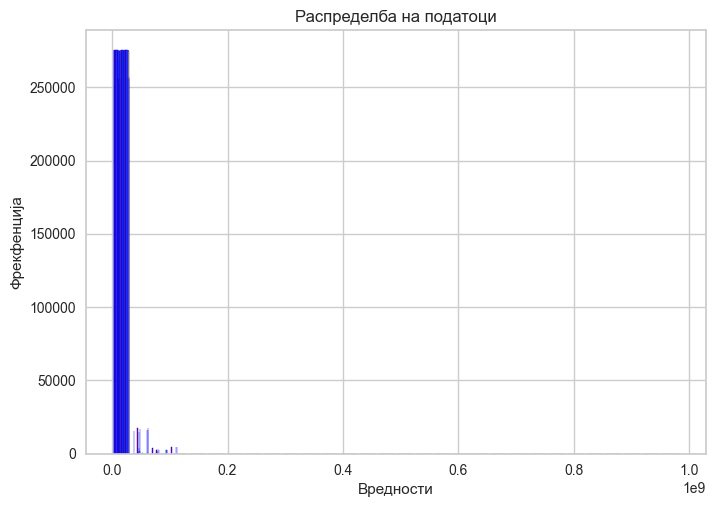

In [18]:
plt.hist(get_config('X_train'), bins=30, edgecolor='blue')
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

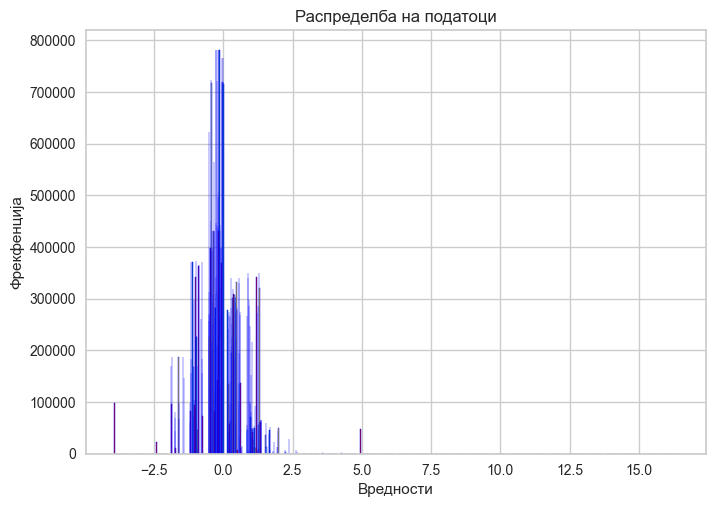

In [19]:
plt.hist(get_config('X_train_transformed'), bins=30, edgecolor='blue')
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

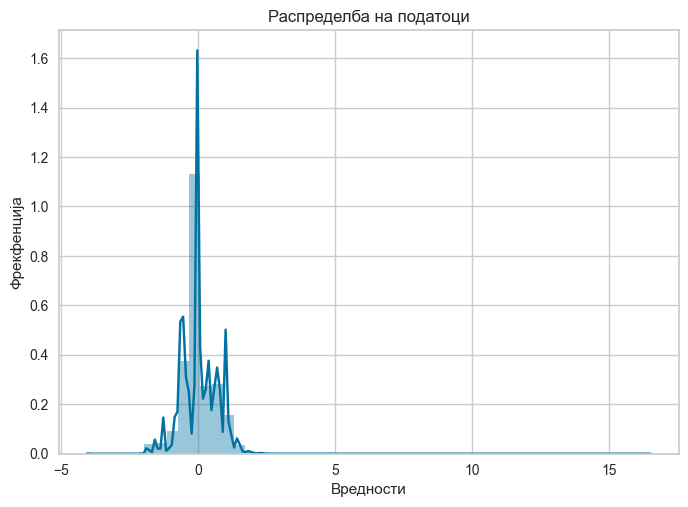

In [20]:
sns.distplot(get_config('X_train_transformed'))
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

## Shapiro-Wilk тест по трансформација на податоците

In [21]:
shapiro(get_config('X_train_transformed'))

ShapiroResult(statistic=1.072229027748108, pvalue=1.0)

По трансформација pvalue е поголемо од 0.5 

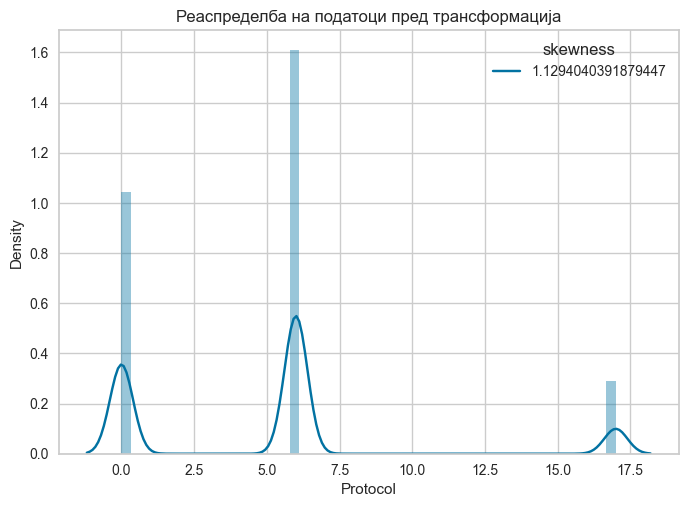

In [22]:
sns.distplot(get_config('X_train')["Protocol"])
plt.title("Реаспределба на податоци пред трансформација")
skewness=str(get_config('X_train')["Protocol"].skew())
plt.legend([skewness],title=("skewness"))


((array([-4.56315618, -4.37342174, -4.27052663, ...,  4.27052663,
          4.37342174,  4.56315618]),
  array([ 0,  0,  0, ..., 17, 17, 17], dtype=int8)),
 (4.147178261341356, 4.961949903856988, 0.8528728730709919))

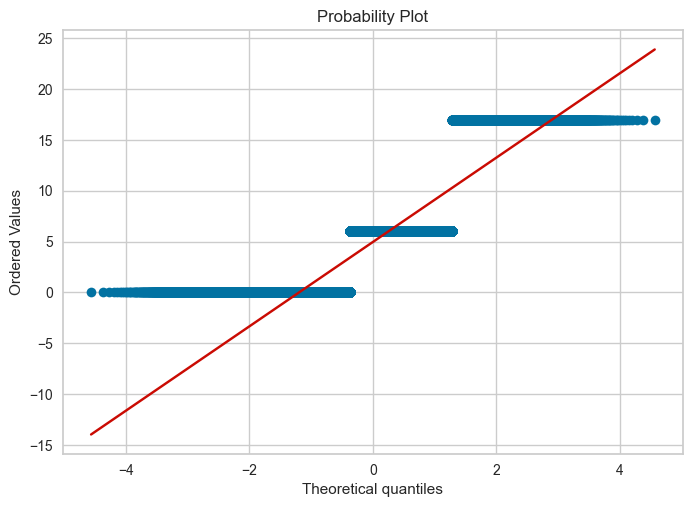

In [23]:
stats.probplot(get_config('X_train')["Protocol"],dist="norm",plot=plt)

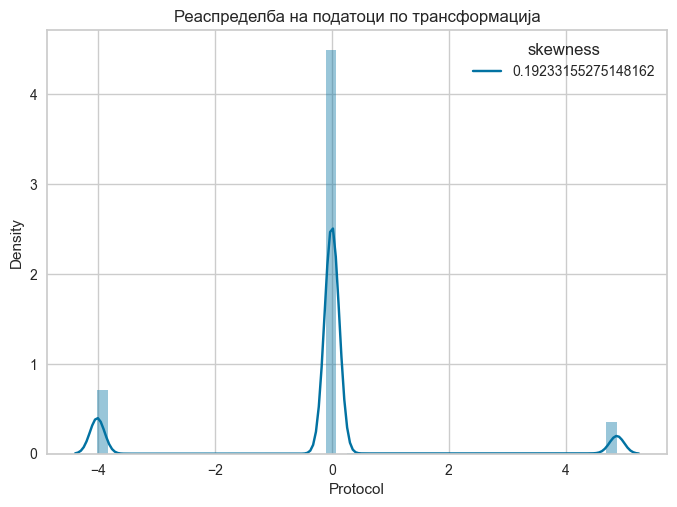

In [24]:
sns.distplot(get_config('X_train_transformed')["Protocol"])
plt.title("Реаспределба на податоци по трансформација")
skewness=str(get_config('X_train_transformed')["Protocol"].skew())
plt.legend([skewness],title=("skewness"))


((array([-4.77733533, -4.59575956, -4.4975387 , ...,  4.4975387 ,
          4.59575956,  4.77733533]),
  array([-4.01351667, -4.01351667, -4.01351667, ...,  4.87573235,
          4.87573235,  4.87573235])),
 (1.478860284091091, -0.16332254059136972, 0.7807287724357128))

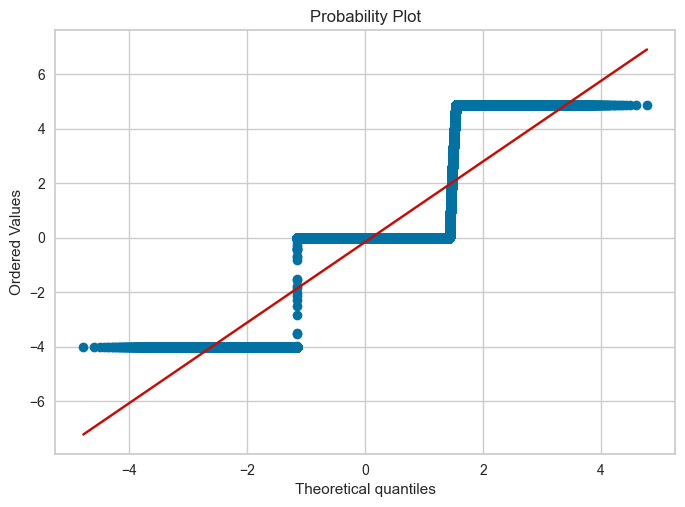

In [25]:
stats.probplot(get_config('X_train_transformed')["Protocol"],dist="norm",plot=plt)

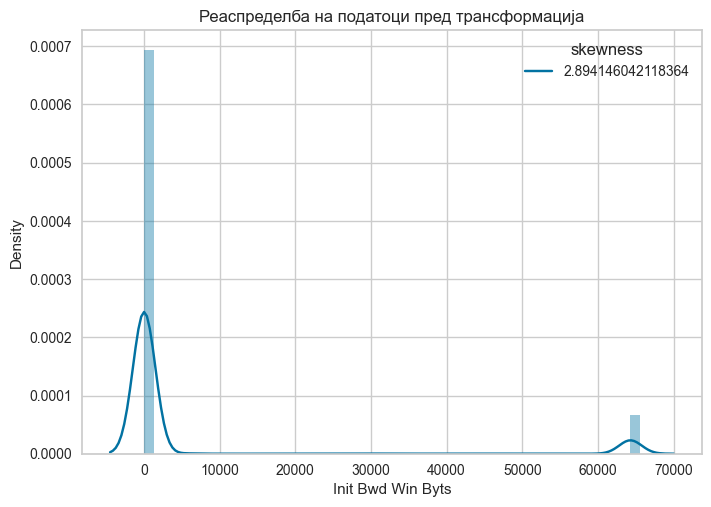

In [26]:
sns.distplot(get_config('X_train')["Init Bwd Win Byts"])
plt.title("Реаспределба на податоци пред трансформација")
skewness=str(get_config('X_train')["Init Bwd Win Byts"].skew())
plt.legend([skewness],title=("skewness"))


((array([-4.56315618, -4.37342174, -4.27052663, ...,  4.27052663,
          4.37342174,  4.56315618]),
  array([   -1,    -1,    -1, ..., 65535, 65535, 65535])),
 (10370.4509292413, 5742.375648374654, 0.5711439520740836))

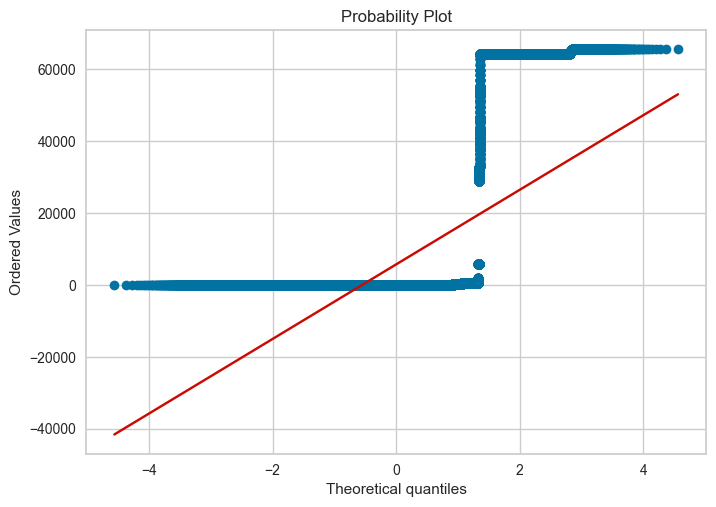

In [27]:
stats.probplot(get_config('X_train')["Init Bwd Win Byts"],dist="norm",plot=plt)

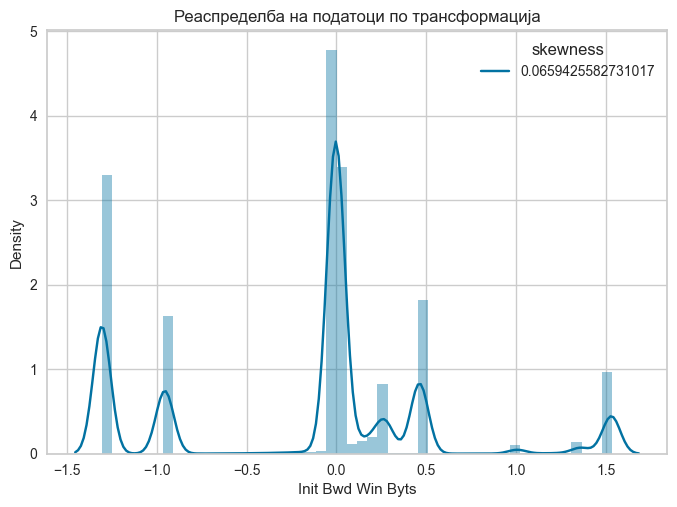

In [28]:

sns.distplot(get_config('X_train_transformed')["Init Bwd Win Byts"])
plt.title("Реаспределба на податоци по трансформација")
skewness=str(get_config('X_train_transformed')["Init Bwd Win Byts"].skew())
plt.legend([skewness],title=("skewness"))



((array([-4.77733533, -4.59575956, -4.4975387 , ...,  4.4975387 ,
          4.59575956,  4.77733533]),
  array([-1.30547225, -1.30547225, -1.30547225, ...,  1.53463091,
          1.53463091,  1.53463091])),
 (0.6895155075503872, -0.1672554650403584, 0.923872211864983))

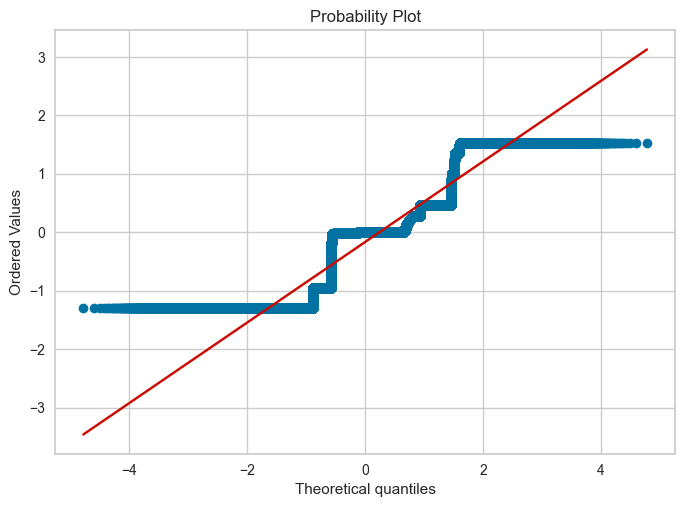

In [29]:
stats.probplot(get_config('X_train_transformed')["Init Bwd Win Byts"],dist="norm",plot=plt)

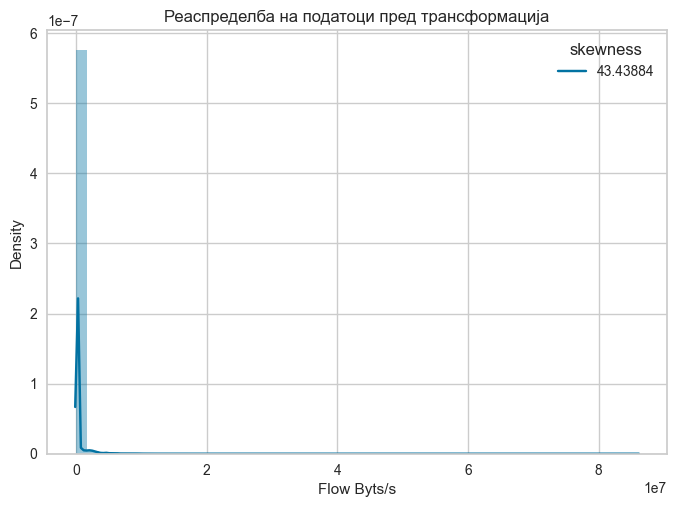

In [37]:
sns.distplot(get_config('X_train')["Flow Byts/s"])
plt.title("Реаспределба на податоци пред трансформација")
skewness=str(get_config('X_train')["Flow Byts/s"].skew())
plt.legend([skewness],title=("skewness"))


((array([-4.56315618, -4.37342174, -4.27052663, ...,  4.27052663,
          4.37342174,  4.56315618]),
  array([       0.,        0.,        0., ..., 73800000., 77000000.,
         86000000.], dtype=float32)),
 (181474.15594715922, 74813.89843749997, 0.27803839046494283))

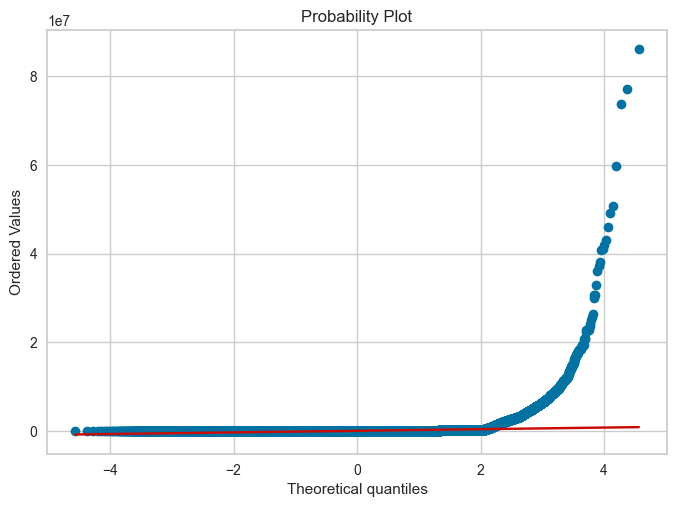

In [38]:
stats.probplot(get_config('X_train')["Flow Byts/s"],dist="norm",plot=plt)

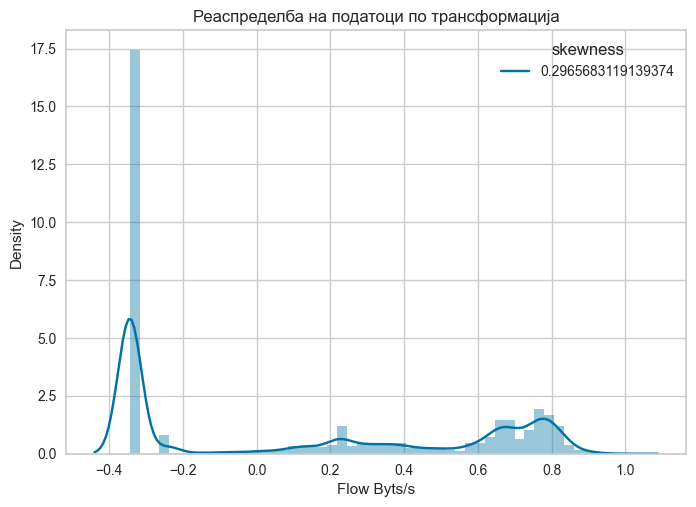

In [39]:

sns.distplot(get_config('X_train_transformed')["Flow Byts/s"])
plt.title("Реаспределба на податоци по трансформација")
skewness=str(get_config('X_train_transformed')["Flow Byts/s"].skew())
plt.legend([skewness],title=("skewness"))


((array([-4.77733533, -4.59575956, -4.4975387 , ...,  4.4975387 ,
          4.59575956,  4.77733533]),
  array([-0.34371121, -0.34371121, -0.34371121, ...,  0.99062865,
          0.99135097,  0.99350363])),
 (0.4231700148595309, 0.11491441565428302, 0.8819064981055558))

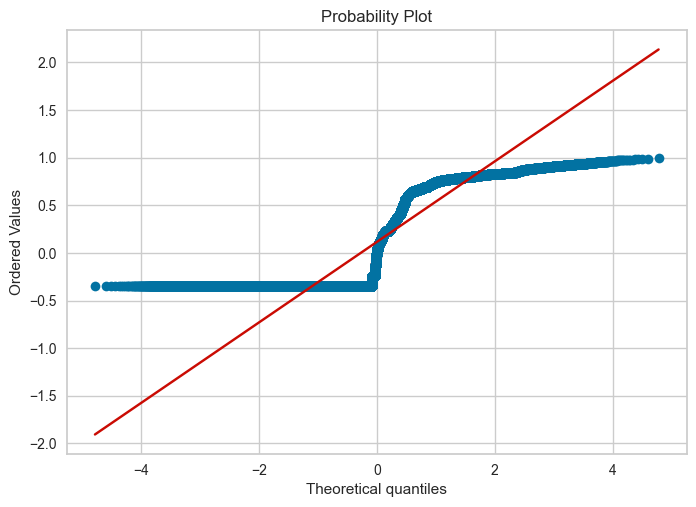

In [40]:
stats.probplot(get_config('X_train_transformed')["Flow Byts/s"],dist="norm",plot=plt)

# Boxplot

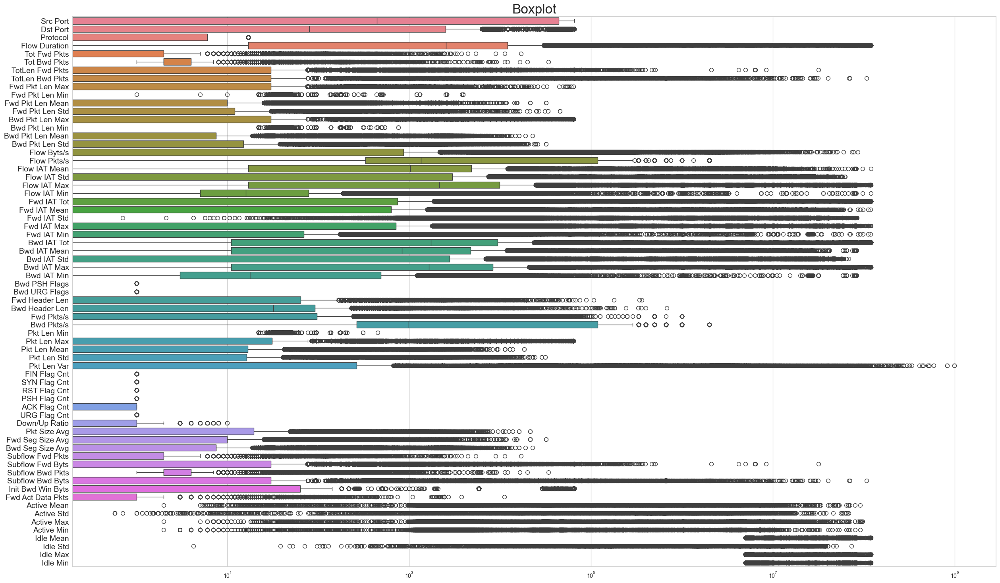

In [41]:
plt.figure(figsize=(30, 18))
sns.boxplot(data=get_config('X_train'), orient="h")
plt.title('Boxplot', fontsize=24)
plt.yticks(fontsize=14)
plt.xscale('log')
plt.show()

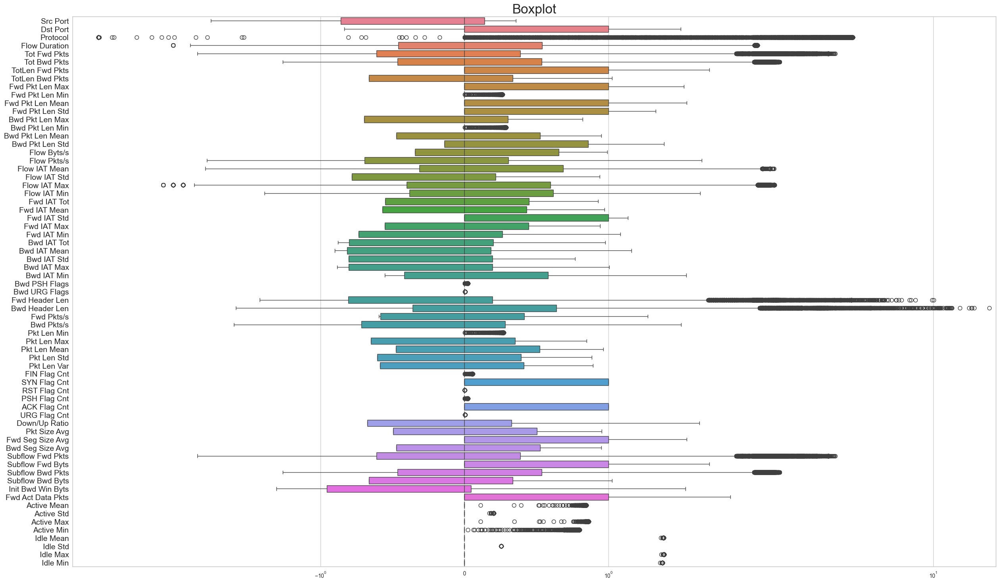

In [42]:
plt.figure(figsize=(30, 18))
sns.boxplot(data=get_config('X_train_transformed'), orient="h")
plt.title('Boxplot', fontsize=24)
plt.yticks(fontsize=14)
plt.xscale('symlog')
plt.show()

# Информација помеѓу карактеристиките и класите

In [73]:
information_gain = mutual_info_classif(get_config('X_train'),get_config('y_train'))

In [74]:
ig_dict = {}
for i in range(len(get_config('X_train').columns)):
    ig_dict[get_config('X').columns[i]] = information_gain[i]
ig_dict_sorted = dict(sorted(ig_dict.items(), key=lambda item: item[1], reverse=True))

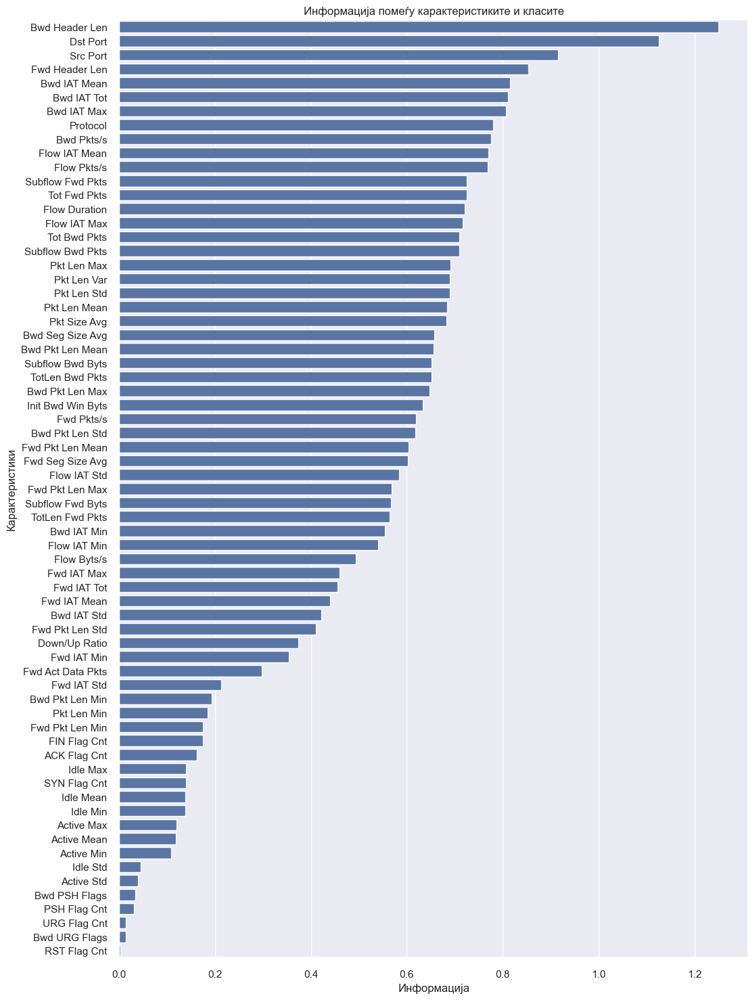

In [75]:
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(12,18)})
sns.barplot(x=list(ig_dict_sorted.values()), y=list(ig_dict_sorted.keys()))
plt.title('Информација помеѓу карактеристиките и класите')
plt.xlabel('Информација')
plt.ylabel('Карактеристики')
plt.show()

In [43]:
information_gain2 = mutual_info_classif(get_config('X_train_transformed'),get_config('y_train_transformed'))

In [44]:
ig_dict2 = {}
for i in range(len(get_config('X_train_transformed').columns)):
    ig_dict2[get_config('X_train_transformed').columns[i]] = information_gain2[i]
ig_dict_sorted2 = dict(sorted(ig_dict2.items(), key=lambda item: item[1], reverse=True))

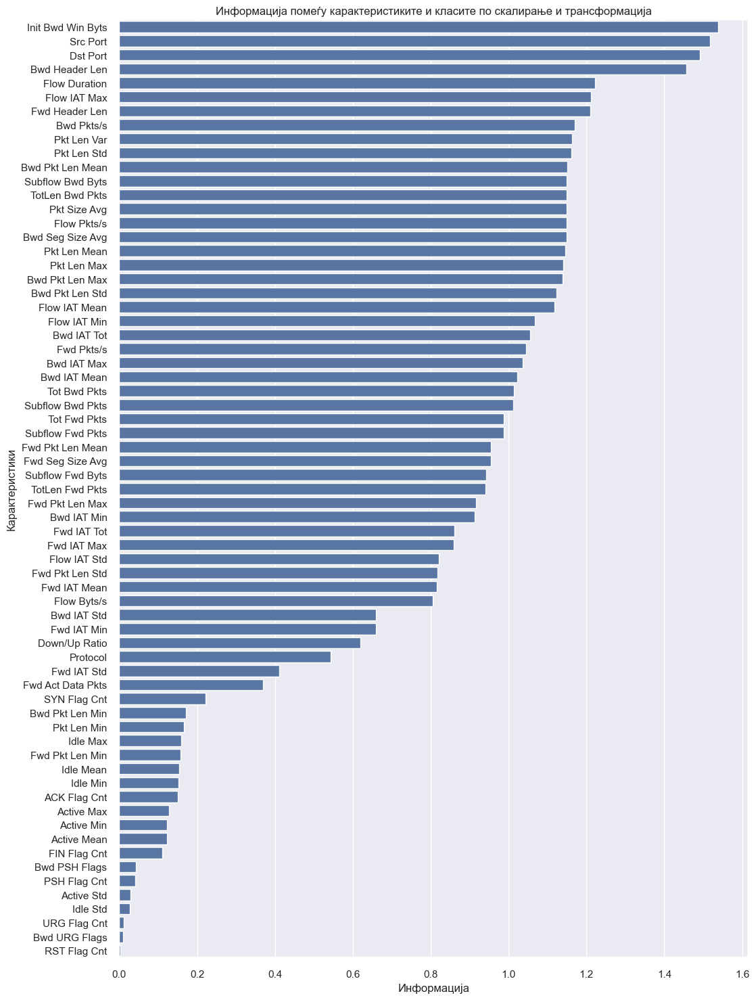

In [45]:
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(12,18)})
sns.barplot(x=list(ig_dict_sorted2.values()), y=list(ig_dict_sorted2.keys()))
plt.title('Информација помеѓу карактеристиките и класите по скалирање и трансформација')
plt.xlabel('Информација')
plt.ylabel('Карактеристики')
plt.show()

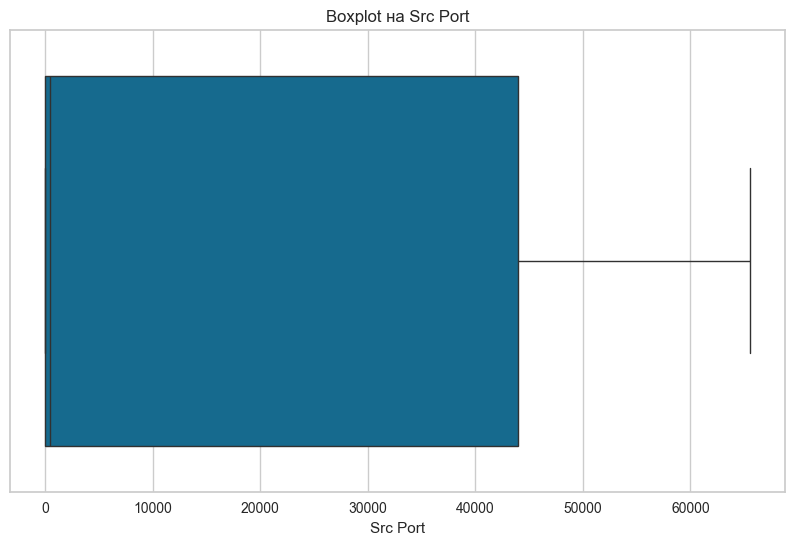

In [88]:
feature = 'Src Port'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

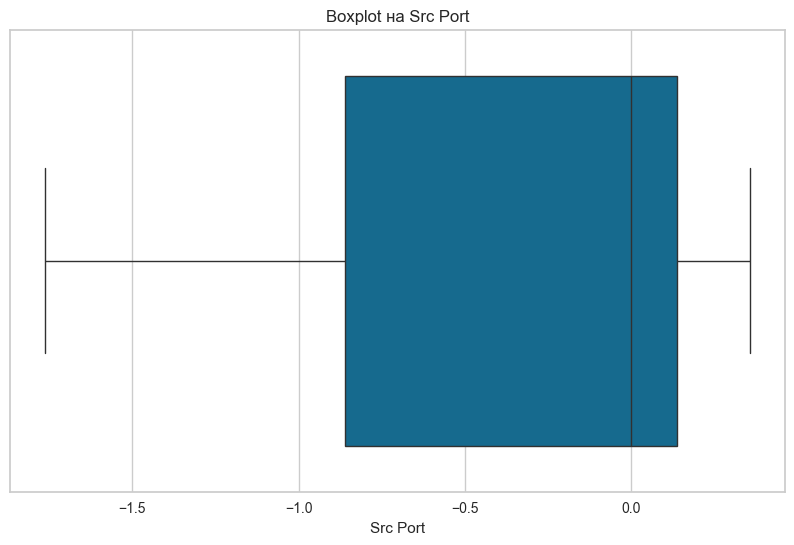

In [87]:
feature = 'Src Port'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

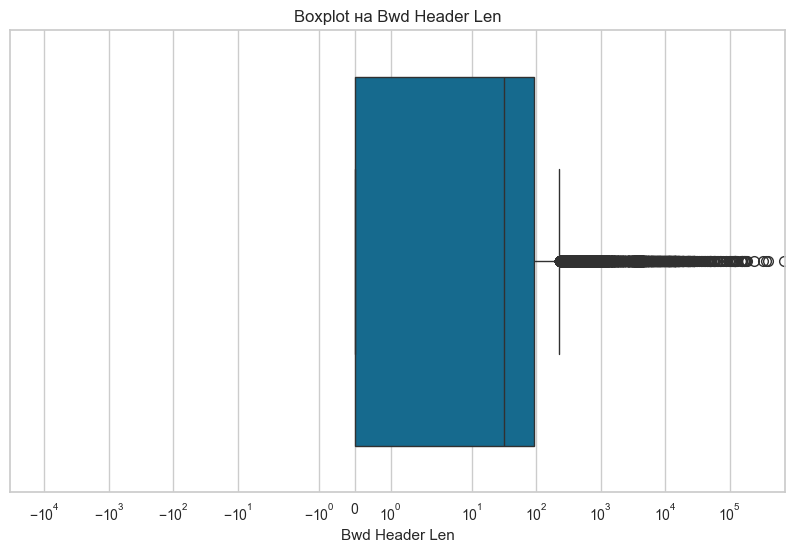

In [99]:
feature = 'Bwd Header Len'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.xscale('symlog') 
plt.title(f'Boxplot на {feature}')
plt.show()

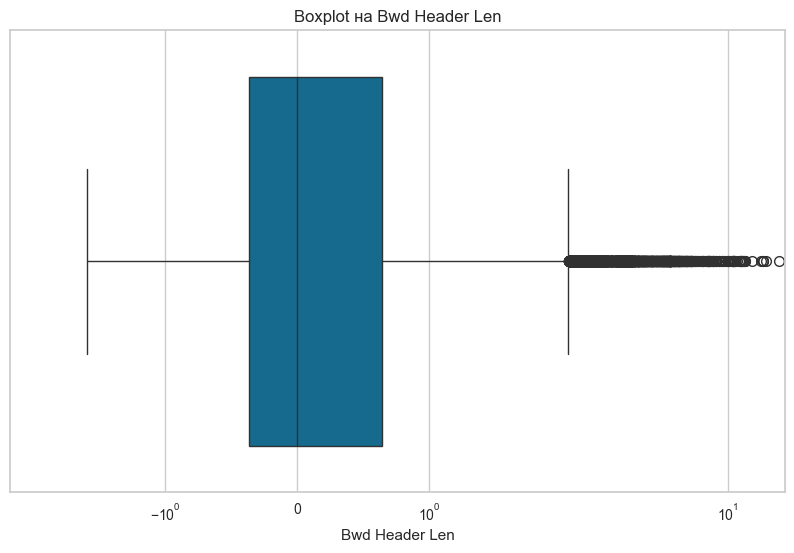

In [96]:
feature = 'Bwd Header Len'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.xscale('symlog') 
plt.title(f'Boxplot на {feature}')
plt.show()

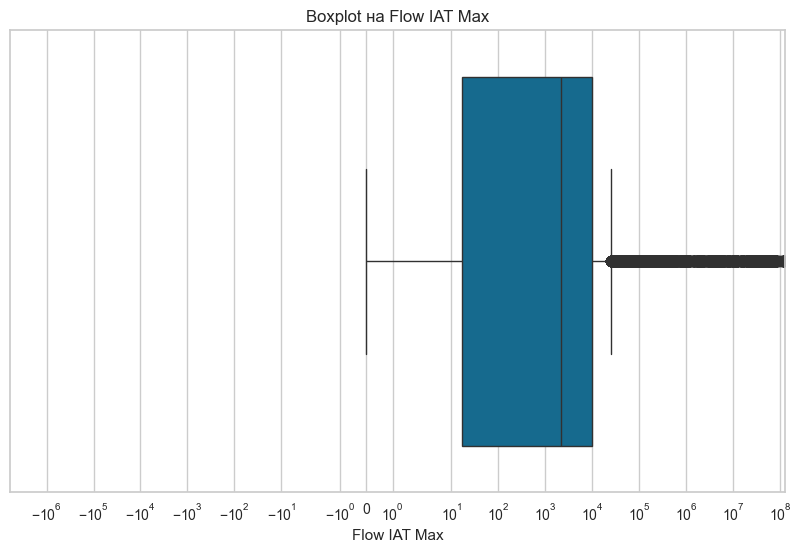

In [100]:
feature = 'Flow IAT Max'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.xscale('symlog') 
plt.title(f'Boxplot на {feature}')
plt.show()

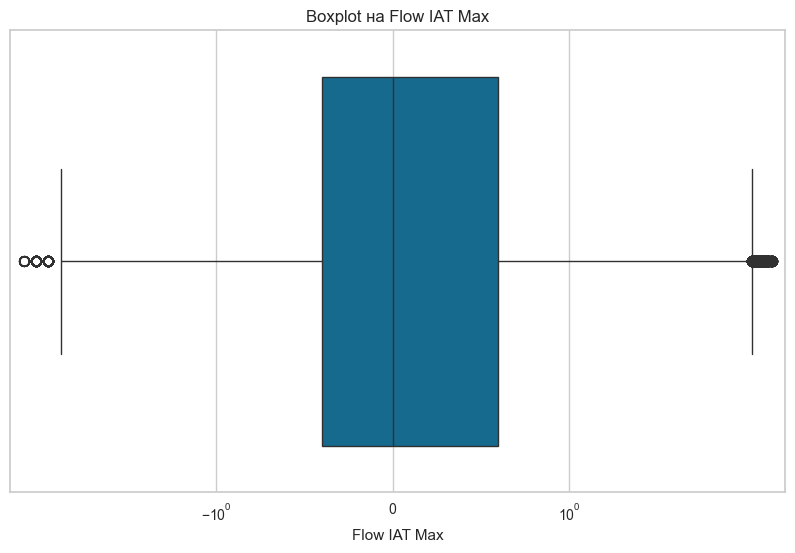

In [101]:
feature = 'Flow IAT Max'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.xscale('symlog') 
plt.title(f'Boxplot на {feature}')
plt.show()

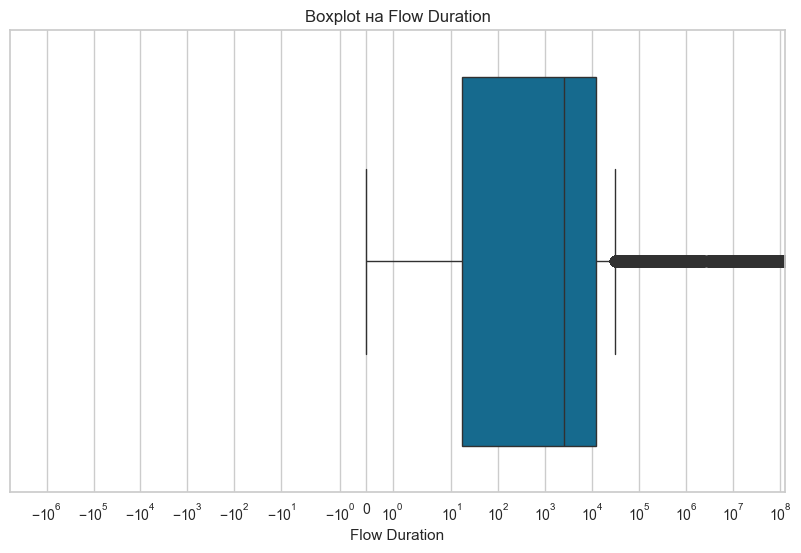

In [102]:
feature = 'Flow Duration'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.xscale('symlog') 
plt.title(f'Boxplot на {feature}')
plt.show()

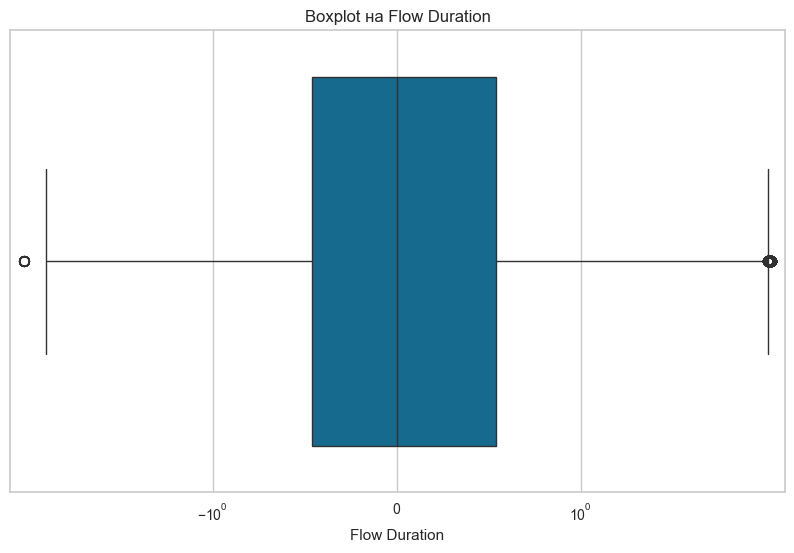

In [103]:
feature = 'Flow Duration'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.xscale('symlog') 
plt.title(f'Boxplot на {feature}')
plt.show()

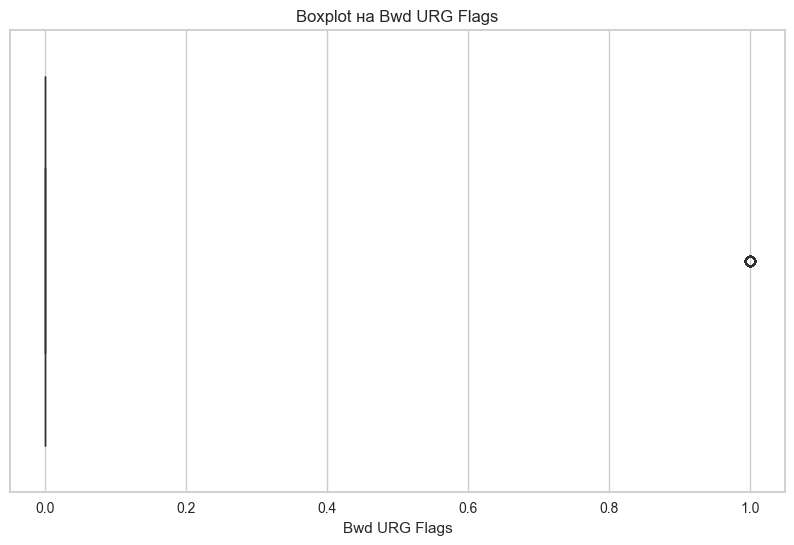

In [113]:
feature = 'Bwd URG Flags'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

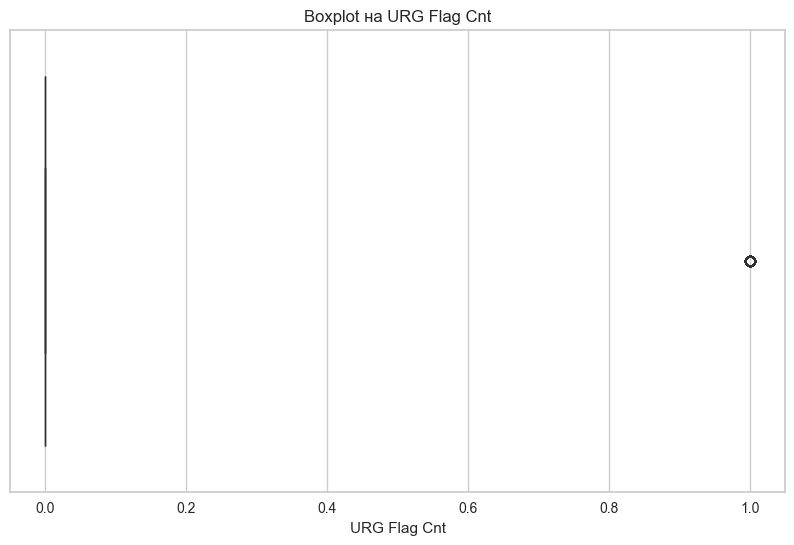

In [106]:
feature = 'URG Flag Cnt'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

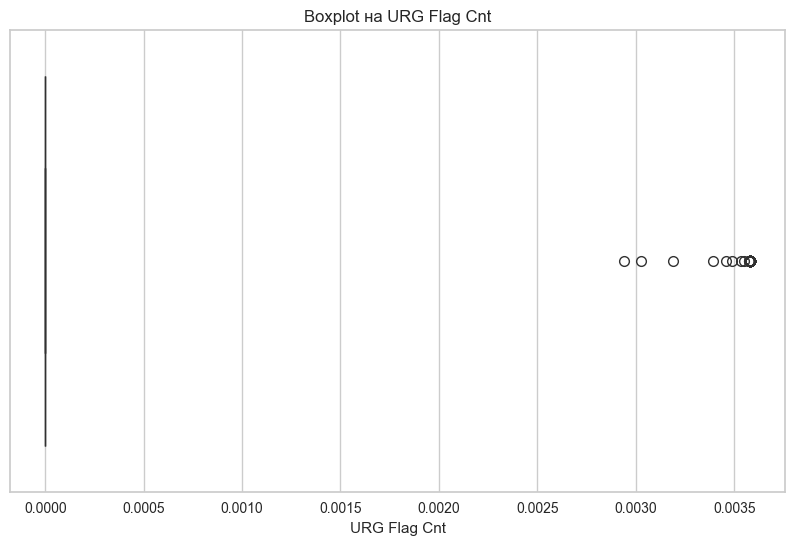

In [107]:
feature = 'URG Flag Cnt'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

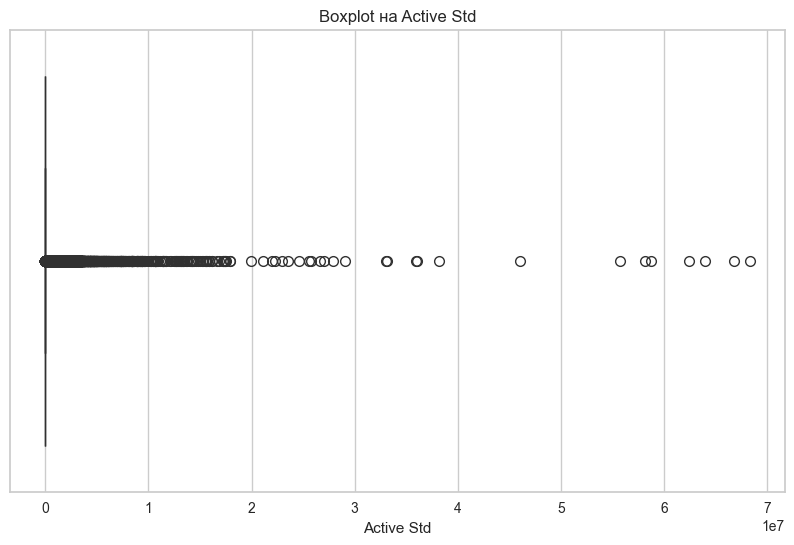

In [110]:
feature = 'Active Std'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

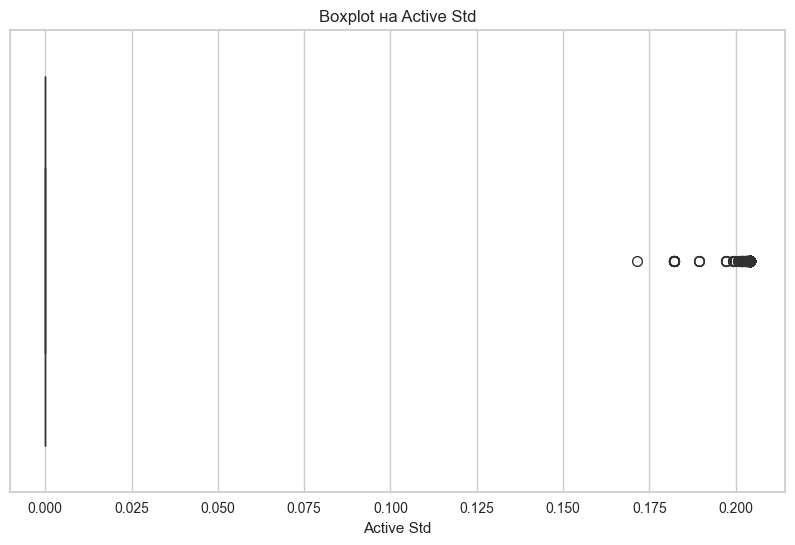

In [111]:
feature = 'Active Std'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

# Број на примероци по балансирање на класите

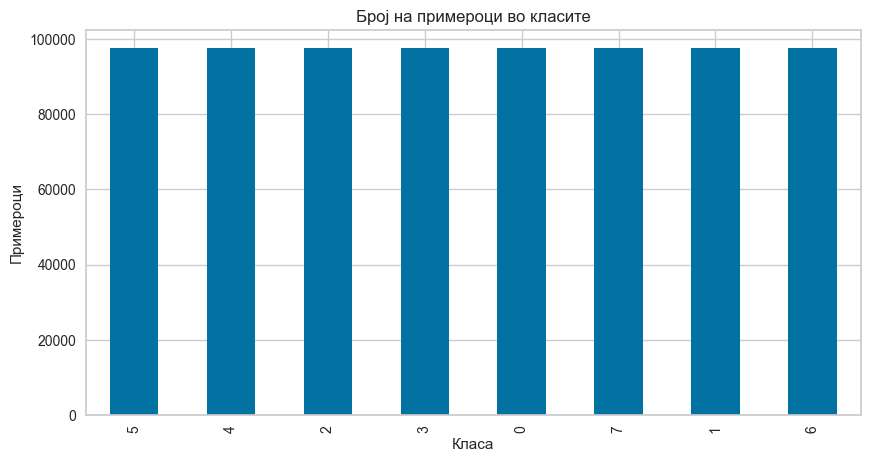

In [37]:
plt.figure(figsize=(10, 5))
get_config('y_train_transformed').value_counts().plot(kind='bar')
plt.title("Број на примероци во класите")
plt.xlabel("Класа")
plt.ylabel("Примероци")
plt.show()

In [38]:
get_config('y_train').value_counts()

DDoS          97553
Probe         78503
Normal        54739
DoS           42893
BFA            1124
Web-Attack      154
BOTNET          131
U2R              14
Name: Label, dtype: int64

In [39]:
get_config('y_train_transformed').value_counts()

5    97553
4    97553
2    97553
3    97553
0    97553
7    97553
1    97553
6    97553
Name: Label, dtype: int64

In [40]:
get_config('y_test').value_counts()

DDoS          24389
Probe         19626
Normal        13685
DoS           10723
BFA             281
Web-Attack       38
BOTNET           33
U2R               3
Name: Label, dtype: int64

In [46]:
get_config('X_train').min().min()

-1.0

In [47]:
get_config('X_train').max().max()

983000000.0

In [48]:
get_config('X_train_transformed').min().min()

-4.013516666684391

In [49]:
get_config('X_train_transformed').max().max()

16.4589865859689

# Тренирање и тестирање на модели

In [9]:
best = compare_models(include=['rf','dt','knn','svm','ada','nb','xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9998,1.0000,0.9998,0.9998,0.9998,0.9997,0.9997,55.5540
rf,Random Forest Classifier,0.9997,1.0000,0.9997,0.9997,0.9997,0.9996,0.9996,70.2660
dt,Decision Tree Classifier,0.9995,0.9997,0.9995,0.9995,0.9995,0.9993,0.9993,38.1940
knn,K Neighbors Classifier,0.9992,0.9998,0.9992,0.9992,0.9992,0.9988,0.9988,129.8900
svm,SVM - Linear Kernel,0.9786,0.0000,0.9786,0.9887,0.9832,0.9707,0.9708,34.9220
nb,Naive Bayes,0.5794,0.9520,0.5794,0.9434,0.6486,0.4876,0.5663,34.4400
ada,Ada Boost Classifier,0.4837,0.7495,0.4837,0.6763,0.4842,0.3835,0.4459,88.0960


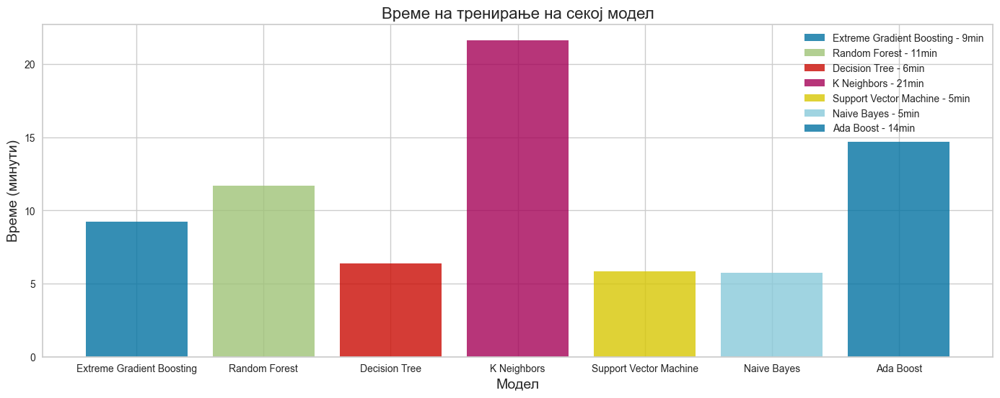

In [164]:
models = ['Extreme Gradient Boosting','Random Forest','Decision Tree', 'K Neighbors','Support Vector Machine','Naive Bayes','Ada Boost' ]
tt_seconds = [555.54, 702.66, 381.94, 1298.90, 349.22, 344.40, 880.96]
tt_minutes = [second/60 for second in tt_seconds] 


plt.figure(figsize=(17, 6))

for model, tt_sec in zip(models, tt_minutes):
    plt.bar(model, tt_sec, label=f'{model} - {int(tt_sec)}min', alpha=0.8)

plt.title('Време на тренирање на секој модел',fontsize=16)
plt.xlabel('Модел',fontsize=14)
plt.ylabel('Време (минути)',fontsize=14)
plt.legend()
plt.show()


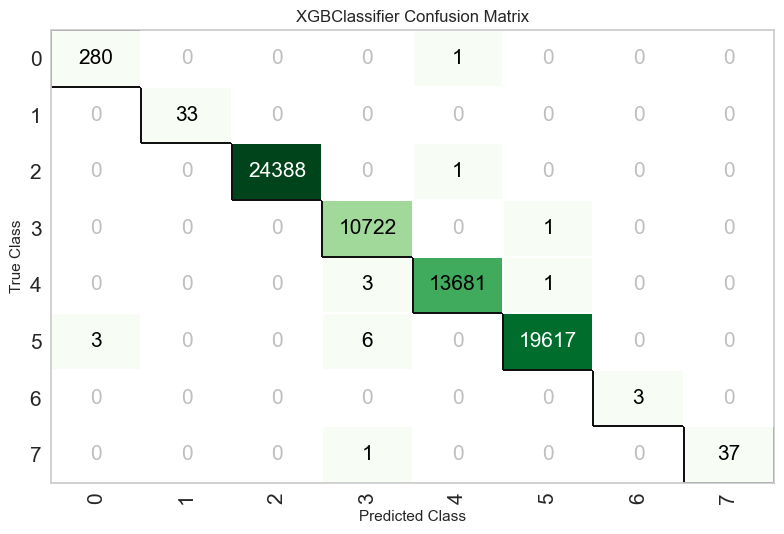

In [10]:
plot_model(best, plot = 'confusion_matrix')

In [9]:
xgb = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9999,1.0000,0.9999,0.9999,0.9999,0.9999,0.9999
1,0.9997,1.0000,0.9997,0.9997,0.9997,0.9997,0.9997
2,0.9997,1.0000,0.9997,0.9997,0.9997,0.9996,0.9996
3,0.9998,1.0000,0.9998,0.9998,0.9998,0.9997,0.9997
4,0.9998,1.0000,0.9998,0.9998,0.9998,0.9997,0.9997
Mean,0.9998,1.0000,0.9998,0.9998,0.9998,0.9997,0.9997
Std,0.0001,0.0000,0.0001,0.0001,0.0001,0.0001,0.0001


In [ ]:
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [11]:
print(best)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softprob', ...)


In [14]:
p_best = predict_model(best)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.9998,1.0000,0.9998,0.9998,0.9998,0.9997,0.9997


In [15]:
p = p_best['prediction_label']

In [12]:
test_y = get_config('y_test')

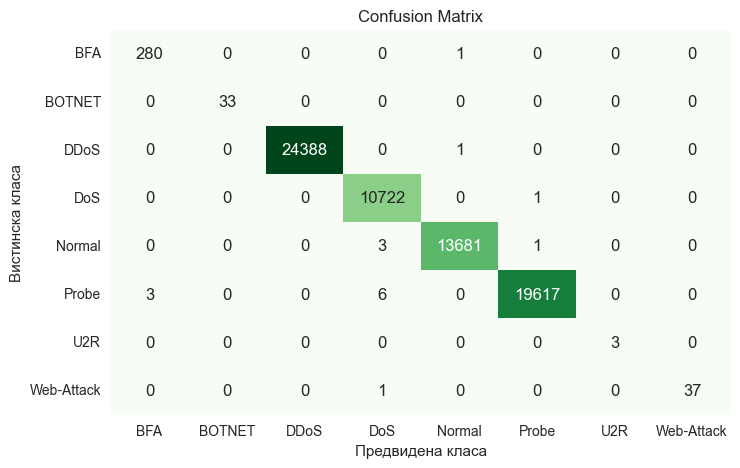

In [17]:
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(test_y, p)
conf_df = pd.DataFrame(conf_matrix, index=['BFA', 'BOTNET','DDoS','DoS','Normal','Probe','U2R','Web-Attack'], 
                       columns=['BFA', 'BOTNET', 'DDoS', 'DoS', 'Normal', 'Probe', 'U2R', 'Web-Attack'])

plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [18]:
from imblearn.metrics import classification_report_imbalanced
target_names=['BFA', 'BOTNET','DDoS','DoS','Normal','Probe','U2R','Web-Attack']
print(classification_report_imbalanced(test_y,p,target_names=target_names))

                   pre       rec       spe        f1       geo       iba       sup

        BFA       0.99      1.00      1.00      0.99      1.00      1.00       281
     BOTNET       1.00      1.00      1.00      1.00      1.00      1.00        33
       DDoS       1.00      1.00      1.00      1.00      1.00      1.00     24389
        DoS       1.00      1.00      1.00      1.00      1.00      1.00     10723
     Normal       1.00      1.00      1.00      1.00      1.00      1.00     13685
      Probe       1.00      1.00      1.00      1.00      1.00      1.00     19626
        U2R       1.00      1.00      1.00      1.00      1.00      1.00         3
 Web-Attack       1.00      0.97      1.00      0.99      0.99      0.97        38

avg / total       1.00      1.00      1.00      1.00      1.00      1.00     68778



In [19]:
print(classification_report(test_y,p))

              precision    recall  f1-score   support

         BFA       0.99      1.00      0.99       281
      BOTNET       1.00      1.00      1.00        33
        DDoS       1.00      1.00      1.00     24389
         DoS       1.00      1.00      1.00     10723
      Normal       1.00      1.00      1.00     13685
       Probe       1.00      1.00      1.00     19626
         U2R       1.00      1.00      1.00         3
  Web-Attack       1.00      0.97      0.99        38

    accuracy                           1.00     68778
   macro avg       1.00      1.00      1.00     68778
weighted avg       1.00      1.00      1.00     68778



In [20]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9997,0.9998,0.9997,0.9997,0.9997,0.9996,0.9996
1,0.9994,0.9996,0.9994,0.9994,0.9994,0.9992,0.9992
2,0.9994,0.9997,0.9994,0.9994,0.9994,0.9992,0.9992
3,0.9995,0.9997,0.9995,0.9995,0.9995,0.9993,0.9993
4,0.9996,0.9997,0.9996,0.9996,0.9996,0.9994,0.9994
Mean,0.9995,0.9997,0.9995,0.9995,0.9995,0.9993,0.9993
Std,0.0001,0.0001,0.0001,0.0001,0.0001,0.0002,0.0002


In [23]:
prediction_dt=predict_model(dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9995,0.9997,0.9995,0.9995,0.9995,0.9993,0.9993


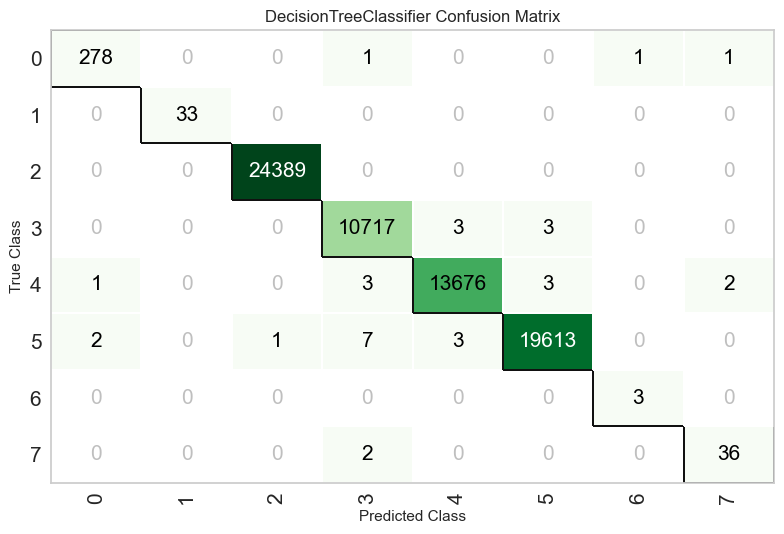

In [24]:
plot_model(dt, plot = 'confusion_matrix')

In [25]:
p_dt = prediction_dt['prediction_label']

In [26]:
print(classification_report(test_y,p_dt))

              precision    recall  f1-score   support

         BFA       0.99      0.99      0.99       281
      BOTNET       1.00      1.00      1.00        33
        DDoS       1.00      1.00      1.00     24389
         DoS       1.00      1.00      1.00     10723
      Normal       1.00      1.00      1.00     13685
       Probe       1.00      1.00      1.00     19626
         U2R       0.75      1.00      0.86         3
  Web-Attack       0.92      0.95      0.94        38

    accuracy                           1.00     68778
   macro avg       0.96      0.99      0.97     68778
weighted avg       1.00      1.00      1.00     68778



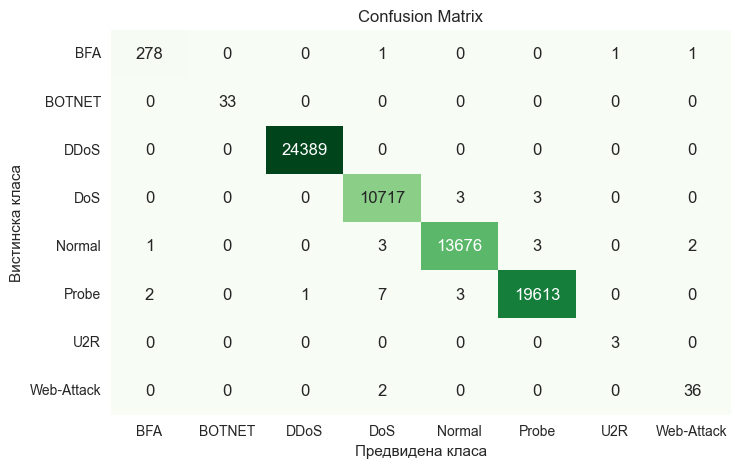

In [27]:
conf_matrix = confusion_matrix(test_y, p_dt)
conf_df = pd.DataFrame(conf_matrix, index=['BFA', 'BOTNET','DDoS','DoS','Normal','Probe','U2R','Web-Attack'], 
                       columns=['BFA', 'BOTNET', 'DDoS', 'DoS', 'Normal', 'Probe', 'U2R', 'Web-Attack'])

plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [28]:
rf= create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9998,1.0000,0.9998,0.9998,0.9998,0.9997,0.9997
1,0.9997,1.0000,0.9997,0.9997,0.9997,0.9995,0.9995
2,0.9997,1.0000,0.9997,0.9997,0.9997,0.9996,0.9996
3,0.9996,1.0000,0.9996,0.9996,0.9996,0.9995,0.9995
4,0.9997,1.0000,0.9997,0.9997,0.9997,0.9996,0.9996
Mean,0.9997,1.0000,0.9997,0.9997,0.9997,0.9996,0.9996
Std,0.0001,0.0000,0.0001,0.0001,0.0001,0.0001,0.0001


In [37]:
p_rf=predict_model(rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9997,1.0000,0.9997,0.9997,0.9997,0.9996,0.9996


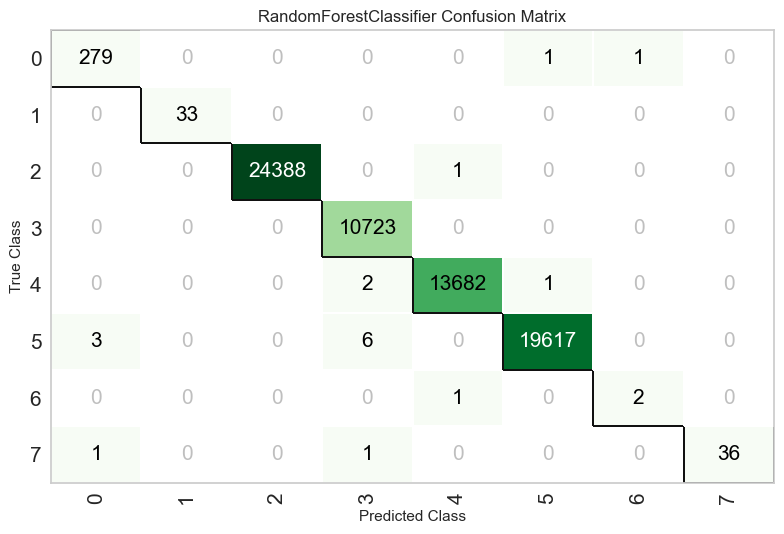

In [30]:
plot_model(rf, plot = 'confusion_matrix')

In [38]:
p_rf = p_rf['prediction_label']

In [ ]:
print(classification_report(test_y,p_rf))

              precision    recall  f1-score   support

         BFA       0.99      0.99      0.99       281
      BOTNET       1.00      1.00      1.00        33
        DDoS       1.00      1.00      1.00     24389
         DoS       1.00      1.00      1.00     10723
      Normal       1.00      1.00      1.00     13685
       Probe       1.00      1.00      1.00     19626
         U2R       0.67      0.67      0.67         3
  Web-Attack       1.00      0.95      0.97        38

    accuracy                           1.00     68778
   macro avg       0.96      0.95      0.95     68778
weighted avg       1.00      1.00      1.00     68778



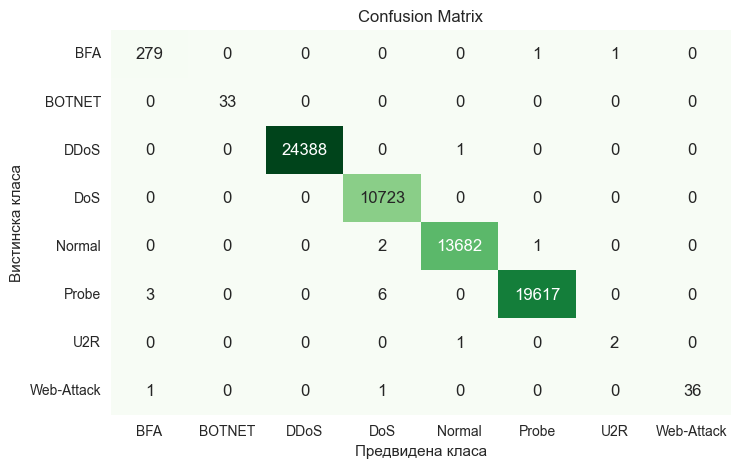

In [39]:
conf_matrix = confusion_matrix(test_y, p_rf)
conf_df = pd.DataFrame(conf_matrix, index=['BFA', 'BOTNET','DDoS','DoS','Normal','Probe','U2R','Web-Attack'], 
                       columns=['BFA', 'BOTNET', 'DDoS', 'DoS', 'Normal', 'Probe', 'U2R', 'Web-Attack'])

plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [40]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9993,0.9998,0.9993,0.9993,0.9993,0.9991,0.9991
1,0.9990,0.9997,0.9990,0.9990,0.9990,0.9987,0.9987
2,0.9992,0.9997,0.9992,0.9992,0.9992,0.9989,0.9989
3,0.9989,0.9997,0.9989,0.9990,0.9990,0.9986,0.9986
4,0.9993,0.9998,0.9993,0.9993,0.9993,0.9991,0.9991
Mean,0.9992,0.9998,0.9992,0.9992,0.9992,0.9988,0.9988
Std,0.0002,0.0000,0.0002,0.0001,0.0002,0.0002,0.0002


In [41]:
p_knn=predict_model(knn)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.9993,0.9998,0.9993,0.9994,0.9993,0.9991,0.9991


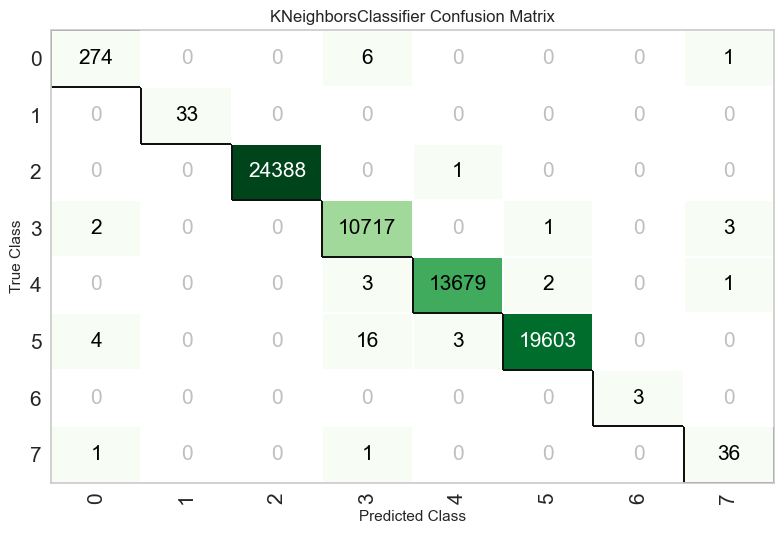

In [42]:
plot_model(knn, plot = 'confusion_matrix')

In [43]:
p_knn= p_knn['prediction_label']

In [44]:
print(classification_report(test_y,p_knn))

              precision    recall  f1-score   support

         BFA       0.98      0.98      0.98       281
      BOTNET       1.00      1.00      1.00        33
        DDoS       1.00      1.00      1.00     24389
         DoS       1.00      1.00      1.00     10723
      Normal       1.00      1.00      1.00     13685
       Probe       1.00      1.00      1.00     19626
         U2R       1.00      1.00      1.00         3
  Web-Attack       0.88      0.95      0.91        38

    accuracy                           1.00     68778
   macro avg       0.98      0.99      0.99     68778
weighted avg       1.00      1.00      1.00     68778



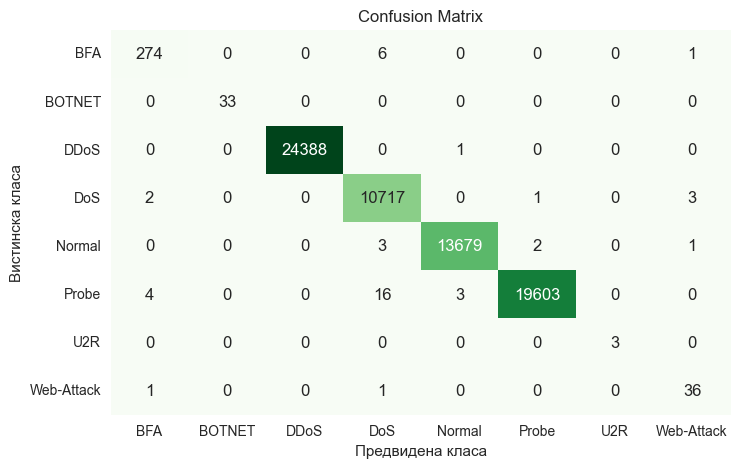

In [45]:
conf_matrix = confusion_matrix(test_y, p_knn)
conf_df = pd.DataFrame(conf_matrix, index=['BFA', 'BOTNET','DDoS','DoS','Normal','Probe','U2R','Web-Attack'], 
                       columns=['BFA', 'BOTNET', 'DDoS', 'DoS', 'Normal', 'Probe', 'U2R', 'Web-Attack'])

plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [46]:
nb = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5813,0.9533,0.5813,0.9437,0.6509,0.4897,0.5685
1,0.5821,0.9532,0.5821,0.9428,0.6511,0.4905,0.5683
2,0.5795,0.9464,0.5795,0.9425,0.6482,0.4877,0.5675
3,0.5752,0.9539,0.5752,0.9441,0.6453,0.4831,0.5613
4,0.5790,0.9532,0.5790,0.9437,0.6475,0.4871,0.5657
Mean,0.5794,0.9520,0.5794,0.9434,0.6486,0.4876,0.5663
Std,0.0024,0.0028,0.0024,0.0006,0.0022,0.0026,0.0027


In [47]:
p_nb=predict_model(nb)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,0.5823,0.9528,0.5823,0.9460,0.6511,0.4908,0.5696


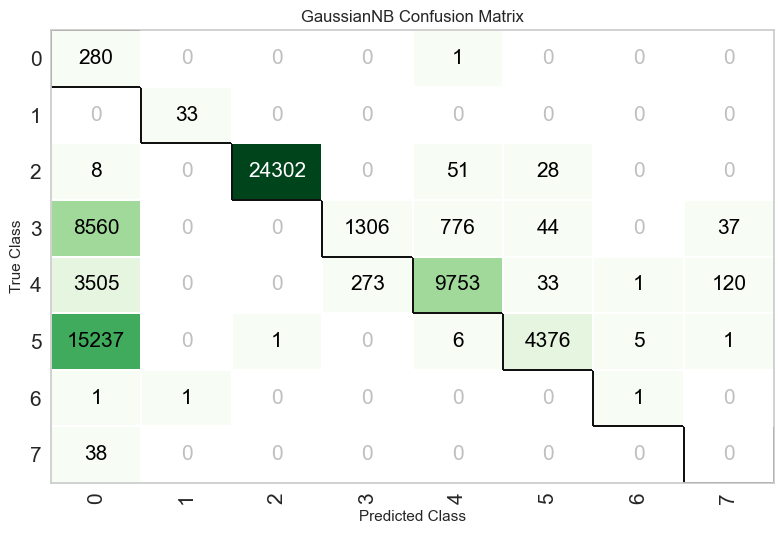

In [48]:
plot_model(nb, plot = 'confusion_matrix')

In [49]:
p_nb= p_nb['prediction_label']

In [50]:
print(classification_report(test_y,p_nb))

              precision    recall  f1-score   support

         BFA       0.01      1.00      0.02       281
      BOTNET       0.97      1.00      0.99        33
        DDoS       1.00      1.00      1.00     24389
         DoS       0.83      0.12      0.21     10723
      Normal       0.92      0.71      0.80     13685
       Probe       0.98      0.22      0.36     19626
         U2R       0.14      0.33      0.20         3
  Web-Attack       0.00      0.00      0.00        38

    accuracy                           0.58     68778
   macro avg       0.61      0.55      0.45     68778
weighted avg       0.95      0.58      0.65     68778



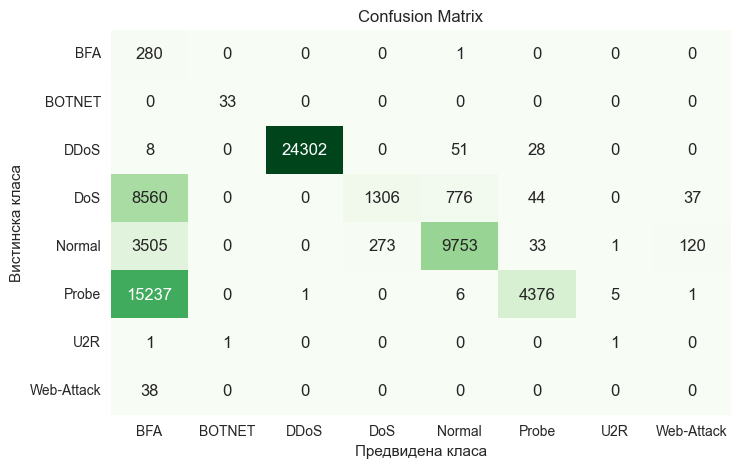

In [51]:
conf_matrix = confusion_matrix(test_y, p_nb)
conf_df = pd.DataFrame(conf_matrix, index=['BFA', 'BOTNET','DDoS','DoS','Normal','Probe','U2R','Web-Attack'], 
                       columns=['BFA', 'BOTNET', 'DDoS', 'DoS', 'Normal', 'Probe', 'U2R', 'Web-Attack'])

plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [52]:
ada = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.1880,0.5937,0.1880,0.0686,0.1004,0.0892,0.1323
1,0.4575,0.7944,0.4575,0.8245,0.5046,0.3624,0.4757
2,0.5857,0.8476,0.5857,0.8003,0.6007,0.4831,0.5414
3,0.5981,0.8331,0.5981,0.8099,0.6090,0.4960,0.5398
4,0.5891,0.6786,0.5891,0.8785,0.6061,0.4865,0.5401
Mean,0.4837,0.7495,0.4837,0.6763,0.4842,0.3835,0.4459
Std,0.1567,0.0979,0.1567,0.3051,0.1958,0.1551,0.1588


In [53]:
p_ada=predict_model(ada)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.1891,0,0.1891,0.0688,0.1009,0.0902,0.1338


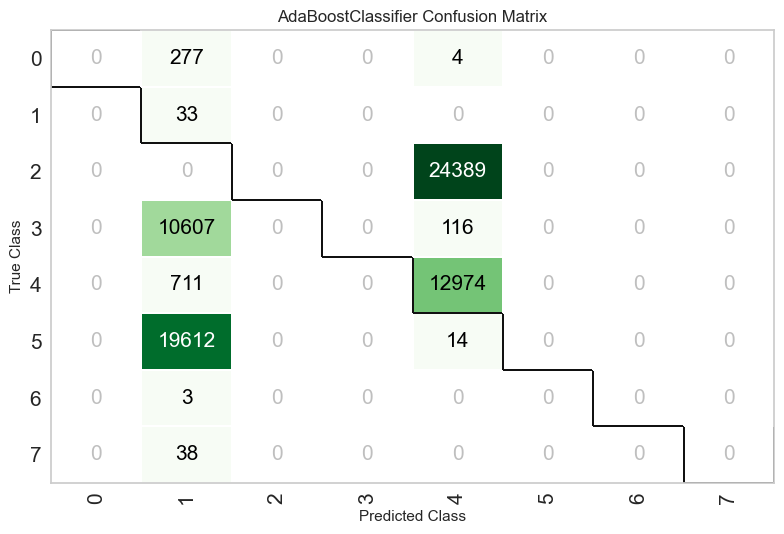

In [54]:
plot_model(ada, plot = 'confusion_matrix')

In [55]:
p_ada= p_ada['prediction_label']

In [56]:
print(classification_report(test_y,p_ada))

              precision    recall  f1-score   support

         BFA       0.00      0.00      0.00       281
      BOTNET       0.00      1.00      0.00        33
        DDoS       0.00      0.00      0.00     24389
         DoS       0.00      0.00      0.00     10723
      Normal       0.35      0.95      0.51     13685
       Probe       0.00      0.00      0.00     19626
         U2R       0.00      0.00      0.00         3
  Web-Attack       0.00      0.00      0.00        38

    accuracy                           0.19     68778
   macro avg       0.04      0.24      0.06     68778
weighted avg       0.07      0.19      0.10     68778



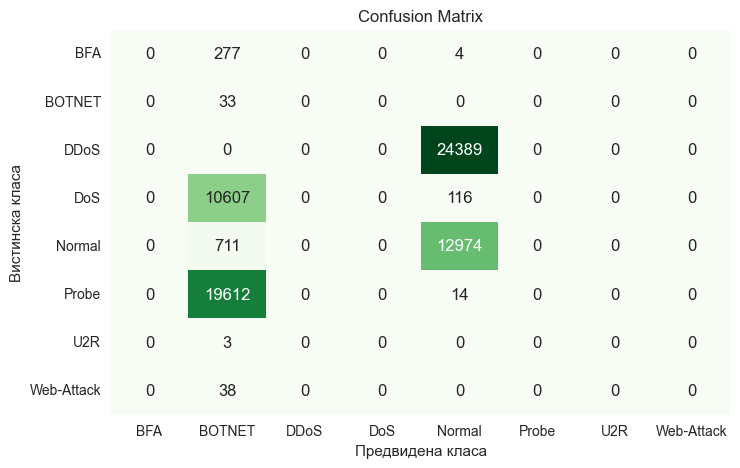

In [57]:
conf_matrix = confusion_matrix(test_y, p_ada)
conf_df = pd.DataFrame(conf_matrix, index=['BFA', 'BOTNET','DDoS','DoS','Normal','Probe','U2R','Web-Attack'], 
                       columns=['BFA', 'BOTNET', 'DDoS', 'DoS', 'Normal', 'Probe', 'U2R', 'Web-Attack'])

plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [58]:
svm = create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9791,0.0000,0.9791,0.9892,0.9838,0.9715,0.9716
1,0.9752,0.0000,0.9752,0.9883,0.9813,0.9661,0.9663
2,0.9841,0.0000,0.9841,0.9883,0.9859,0.9782,0.9782
3,0.9776,0.0000,0.9776,0.9891,0.9828,0.9693,0.9695
4,0.9769,0.0000,0.9769,0.9888,0.9824,0.9685,0.9686
Mean,0.9786,0.0000,0.9786,0.9887,0.9832,0.9707,0.9708
Std,0.0030,0.0000,0.0030,0.0004,0.0016,0.0041,0.0041


In [60]:
p_svm = predict_model(svm)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9773,0,0.9773,0.9893,0.9829,0.9690,0.9692


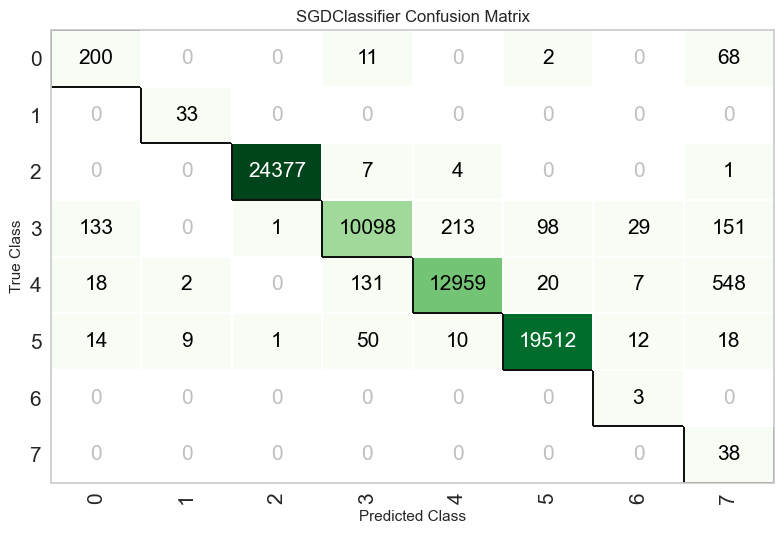

In [59]:
plot_model(svm, plot = 'confusion_matrix')

In [61]:
p_svm = p_svm['prediction_label']

In [62]:
print(classification_report(test_y,p_svm))

              precision    recall  f1-score   support

         BFA       0.55      0.71      0.62       281
      BOTNET       0.75      1.00      0.86        33
        DDoS       1.00      1.00      1.00     24389
         DoS       0.98      0.94      0.96     10723
      Normal       0.98      0.95      0.96     13685
       Probe       0.99      0.99      0.99     19626
         U2R       0.06      1.00      0.11         3
  Web-Attack       0.05      1.00      0.09        38

    accuracy                           0.98     68778
   macro avg       0.67      0.95      0.70     68778
weighted avg       0.99      0.98      0.98     68778



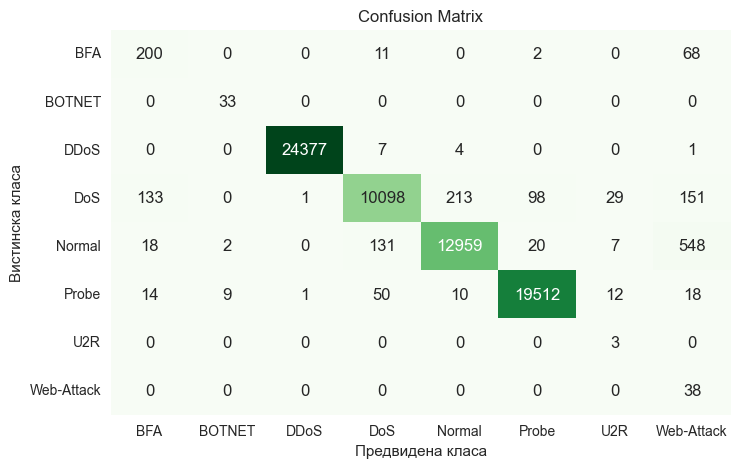

In [63]:
conf_matrix = confusion_matrix(test_y, p_svm)
conf_df = pd.DataFrame(conf_matrix, index=['BFA', 'BOTNET','DDoS','DoS','Normal','Probe','U2R','Web-Attack'], 
                       columns=['BFA', 'BOTNET', 'DDoS', 'DoS', 'Normal', 'Probe', 'U2R', 'Web-Attack'])

plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

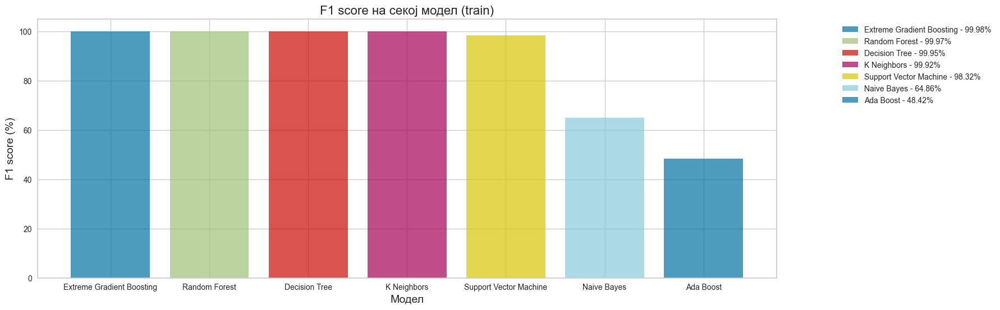

In [162]:
models = ['Extreme Gradient Boosting','Random Forest','Decision Tree', 'K Neighbors','Support Vector Machine','Naive Bayes','Ada Boost' ]
f1_scores = [0.9998, 0.9997, 0.9995, 0.9992, 0.9832, 0.6486, 0.4842 ]
f1_percentages = [f1 * 100 for f1 in f1_scores]

plt.figure(figsize=(17, 6))

for model, f1_percentage in zip(models, f1_percentages):
    plt.bar(model, f1_percentage, label=f'{model} - {f1_percentage:.2f}%', alpha=0.7)

plt.title('F1 score на секој модел (train)',fontsize=16)
plt.xlabel('Модел',fontsize=14)
plt.ylabel('F1 score (%)',fontsize=14)
plt.legend(loc='upper right',bbox_to_anchor=(1.3, 1))
plt.show()



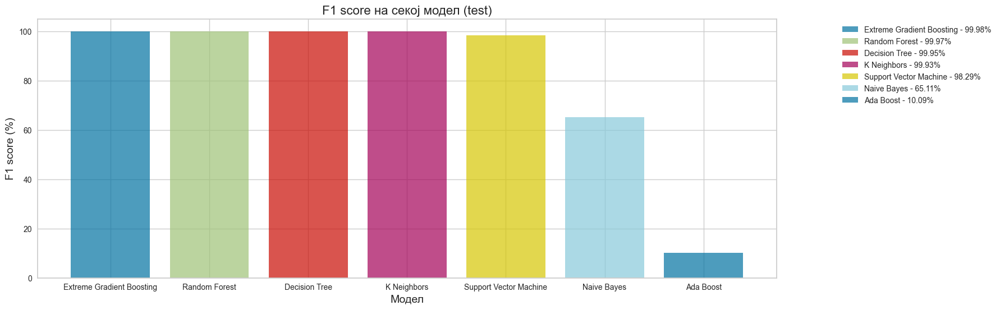

In [160]:
models = ['Extreme Gradient Boosting','Random Forest','Decision Tree', 'K Neighbors','Support Vector Machine','Naive Bayes','Ada Boost' ]
f1_scores = [0.9998, 0.9997, 0.9995, 0.9993, 0.9829, 0.6511, 0.1009 ]
f1_percentages = [f1 * 100 for f1 in f1_scores]

plt.figure(figsize=(17, 6))

for model, f1_percentage in zip(models, f1_percentages):
    plt.bar(model, f1_percentage, label=f'{model} - {f1_percentage:.2f}%', alpha=0.7)

plt.title('F1 score на секој модел (test)',fontsize=16)
plt.xlabel('Модел',fontsize=14)
plt.ylabel('F1 score (%)',fontsize=14)
plt.legend(loc='upper right',bbox_to_anchor=(1.3, 1))
plt.show()


In [64]:
finalize_best = finalize_model(best)

In [66]:
save_model(finalize_best,'FinalizedModelMulticlass')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('label_encoding',
                  TransformerWrapperWithInverse(exclude=None, include=None,
                                                transformer=LabelEncoder())),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Src Port', 'Dst Port', 'Protocol',
                                              'Flow Duration', 'Tot Fwd Pkts',
                                              'Tot Bwd Pkts', 'TotLen Fwd Pkts',
                                              'TotLen Bwd Pkts',
                                              'Fwd Pkt Len Max',
                                              'Fwd Pkt Len Min',
                                              'Fwd Pk...
                                importance_type=None,
                                interaction_constraints=None, learning_rate=None,
                                max_bin=None, max_

In [67]:
save_experiment('MulticlassClassification')

In [68]:
save_model(best,'BestModelMulticlass')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('label_encoding',
                  TransformerWrapperWithInverse(exclude=None, include=None,
                                                transformer=LabelEncoder())),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Src Port', 'Dst Port', 'Protocol',
                                              'Flow Duration', 'Tot Fwd Pkts',
                                              'Tot Bwd Pkts', 'TotLen Fwd Pkts',
                                              'TotLen Bwd Pkts',
                                              'Fwd Pkt Len Max',
                                              'Fwd Pkt Len Min',
                                              'Fwd Pk...
                                importance_type=None,
                                interaction_constraints=None, learning_rate=None,
                                max_bin=None, max_